# Libraries

In [1]:
import do_mpc
from casadi import *
from casadi.tools import *
import numpy as np
import scipy.integrate as scp
import matplotlib.pyplot as plt
from scipy.integrate import odeint
import numpy.random as rnd
import torch
import copy
import torch.nn.functional as F
from scipy.optimize import minimize
from torch_pso import ParticleSwarmOptimizer
from scipy.signal import find_peaks

In [2]:
def sample_uniform_params(params_prev, param_max, param_min):
    params = {k: torch.rand(v.shape)* (param_max - param_min) + param_min \
              for k, v in params_prev.items()}
    return params

def sample_local_params(params_prev, param_max, param_min):
    params = {k: torch.rand(v.shape)* (param_max - param_min) + param_min + v \
              for k, v in params_prev.items()}
    return params

# Process Environment

In [3]:
def PID(Ks, x, x_setpoint, e_history):

    # K gains
    KpCa = Ks[0]; KiCa = Ks[1]; KdCa = Ks[2]
    KpT  = Ks[3]; KiT  = Ks[4]; KdT  = Ks[5]; Kb = Ks[6]
    # setpoint error

    e = x_setpoint - x
    # if Ks[0] == 0 and Ks[1] == 0 and Ks[2] == 0:
    #   e = x - x_setpoint
    # control action
    u = KpT *e[1] + KiT *sum(e_history[:,1]) + KdT *(e[1]-e_history[-1,1])
    u -= KpCa*e[0] + KiCa*sum(e_history[:,0]) + KdCa*(e[0]-e_history[-1,0])
    u += Kb
    u = min(max(u,200),400)


    return u

In [4]:
def PID_Dist(Ks, x, x_setpoint, e_history):

    # K gains
    Kp = Ks[0]; Ki = Ks[1]; Kd = Ks[2];  Kb = Ks[3]
    # setpoint error

    e = x_setpoint - x
    # if Ks[0] == 0 and Ks[1] == 0 and Ks[2] == 0:
    #   e = x - x_setpoint#

    # control action
    rr  = Kp*e + Ki*sum(e_history[:]) + Kd*(e-e_history[-1])
    rr += Kb

    rr = min(max(rr,0),10)


    return rr

In [5]:
def dynamics_CS2(x,t,Tc,rr,Tf,k0,UA):

  '''
  Function takes the control input from RL algorithm, and previous states and returns
  the next state of the system

  States:
  x(0) - Reflux Drum Liquid Mole Fraction of Component A
  x(1-15) - Tray 1-15 - Liquid Mole Fraction of Component A
  x(16-29) - Tray 16-29 - Liquid Mole Fraction of Component A (Feed)
  x(30) - Tray 30 - Liquid Mole Fraction of Component A
  x(31) - Reboiler Liquid Mole Fraction of Component A
  x(32) - Reactor outlet contration of A (mol/m3)
  x(33) - Temperature in the CSTR  (K)


  Control inputs:
  Tc - Temperature of reactor jacket
  rr - Reflux ratio

  Other inputs:
  Tf - Temperature of the feed (K). Used for disturbance rejection testing

  Outputs:
  xdot - next state of the system
  '''

  # == Reactor parameters == #

  Capf   = 1      # Process feed concentration of component A (mol/3)
  q      = 100    # Volumetric Flowrate (m^3/sec)
  V      = 100    # Volume of CSTR (m^3)
  rho    = 1000   # Density of A-B Mixture (kg/m^3)
  rho_M  = 0.2     # Molar density of A-B mix (mol/m3)
  Cp     = 0.239  # Heat capacity of A-B Mixture (J/kg-K)
  mdelH  = 5e4    # Heat of reaction for A->B (J/mol)
  EoverR = 8750   # E -Activation energy (J/mol), R -Constant = 8.31451 J/mol-K
  # k0     = 7.2e10 # Pre-exponential factor (1/sec)
  # UA     = 7e5    # U -Heat Transfer Coefficient (W/m^2-K) A -Area - (m^2)

  # == States == #
  Ca = x[32]
  T = x[33]


  # == Reactor Equations == #
  xdot = np.empty(len(x))
  qrf =  q

  Caf = 1
  rA     = k0*np.exp(-EoverR/T)*Ca # reaction rate
  xdot[32]  = q/V*(Caf - Ca) - rA     # Calculate concentration derivative
  xdot[33]   = q/V*(Tf - T) \
            + mdelH/(rho*Cp)*rA \
            + UA/V/rho/Cp*(Tc-T)   # Calculate temperature derivative


  Cb = (Caf*qrf-Ca*qrf)/qrf
  x_b = Cb*qrf/(Cb*qrf+Ca*qrf)
  x_feed = x_b
  qrf = qrf*rho_M

  # == Distillation Column Parameters == #
  # Vapor Mole Fractions of Component A
  # From the equilibrium assumption and mole balances
  # 1) vol = (yA/xA) / (yB/xB)
  # 2) xA + xB = 1
  # 3) yA + yB = 1

  D=0.5*qrf    # Distillate Flowrate (mol/s)
  B = qrf-D     # Bottoms flowrate (mol/s)
  L=rr*D        # Flowrate of the Liquid in the Rectification Section (mol/s)
  V=L+D         # Vapor Flowrate in the Column (mol/s)
  FL=qrf+L     # Flowrate of the Liquid in the Stripping Section (mol/s)
  vol=1.6         # Relative Volatility = (yA/xA)/(yB/xB) = KA/KB = alpha(A,B)
  atray=3       # Total Molar Holdup in the Condenser
  acond=1       # Total Molar Holdup on each Tray
  areb=0.5      # Total Molar Holdup in the Reboiler
  purge_ratio = 0.5 # Purge ratio

  # == Distillation Column equations == #
  y = np.empty(32)

  for i in range(32):
      y[i] = x[i] * vol/(1.0+(vol-1.0)*x[i])

  xdot[0] = 1/acond*V*(y[1]-x[0])
  for i in range(1,16):
      xdot[i] = 1.0/atray*(L*(x[i-1]-x[i])-V*(y[i]-y[i+1]))
  xdot[16] = 1/atray*(qrf*x_feed+L*x[15]-FL*x[16]-V*(y[16]-y[17]))
  for i in range(17,31):
      xdot[i] = 1.0/atray*(FL*(x[i-1]-x[i])-V*(y[i]-y[i+1]))
  xdot[31] = 1/areb*(FL*x[30]-(qrf-D)*x[31]-V*y[31])


  return  xdot

In [195]:
def RS_sim(Ks_opt,policy,ns,SP,time_step,disturb,minimise,full_output,k0,UA):
  # == data structures == #
  t  = np.linspace(0,time_step,ns)
  Ks_react_list = np.zeros((7,len(t)))
  Ks_dist_list = np.zeros((4,len(t)))
  e_history = []
  e_history_dist = []
  u = np.zeros((2,len(t)))
  x = np.zeros((34,len(t)))
  ie = np.zeros((len(t)))
  # == Normalisation ==#
  x_norm_react   = np.array([[.8, 315,0, 0],[.1, 10,.1, 20]])
  x_norm_dist = ([[0.96,0.95,0.96],[0.1,0.1,0.1]])

  # == Setpoints == #
  Ca_des = SP[0]
  T_des = SP[1]
  xd_des = SP[2]

  # == Initial states == #
  x_ss =np.array([0.935,0.900,0.862,0.821,0.779,0.738,\
  0.698,0.661,0.628,0.599,0.574,0.553,0.535,0.521,    \
  0.510,0.501,0.494,0.485,0.474,0.459,0.441,0.419,    \
  0.392,0.360,0.324,0.284,0.243,0.201,0.161,0.125,    \
  0.092,0.064])
  for i_s in range(32):
    x[i_s,0] = x_ss[i_s]
  x[32,0] = 0.87725294608097 # Reactor outlet concentration of Component A
  x[33,0] = 324.475443431599 # Temperature inside the CSTR


  # == Initial Controls == #
  u[0,0] = 295 # Jacket temperature
  u[1,0] = 3   # Reflux ratio

  # == Simulation loop == #
  op_hi = 10
  op_lo = 0

  Tf = np.ones(len(t))*350 # Feed Temperature (K)

  if disturb:
      Tf[10:30] = 360
  for i in range(len(t)-1):
    #Time step
    ts      = [t[i],t[i+1]]
    #If using RL algorithm
    if minimise == False:
      #Construct state for RL policy
      xk_react = np.hstack((x[32,i],x[33,i],Ca_des[i],T_des[i]))
      if i > 0:
        xk_dist = np.hstack((x[0,i],xd_des[i],x[0,i-1]))
      else:
        xk_dist = np.hstack((x[0,i],xd_des[i],x[0,i-1]))

      #Normalise State
      xk_norm_react = ((xk_react-x_norm_react[0])/x_norm_react[1])
      xk_norm_dist = ((xk_dist-x_norm_dist[0])/x_norm_dist[1])
      state_react = torch.tensor(xk_norm_react)
      state_dist = torch.tensor(xk_norm_dist)

      #Get PID Ks from RL policy
      Ks_react = np.abs(policy(state_react).detach().numpy())
      Ks_dist = np.abs(policy(state_dist).detach().numpy())
      for ks_i in range(0,3):
          Ks_react[ks_i] = (Ks_react[ks_i])*50/6
          Ks_react_list[ks_i,i] = Ks_react[ks_i]
      for ks_i in range(3,6):
          Ks_react[ks_i] = (Ks_react[ks_i])*0.5/6
          Ks_react_list[ks_i,i] = Ks_react[ks_i]
      Ks_react[6] = 290
      Ks_react_list[6,i] = Ks_react[6]
        
   




    if minimise:
      Ks_react = Ks_opt[:7]
      Kc = Ks_opt[7]
      tauI = Ks_opt[8]
      tauD = Ks_opt[9]
      kb = Ks_opt[10]
    # Reactor Control
    SP_react = np.hstack((Ca_des[i],T_des[i]))
    react_state = np.hstack((x[32,i],x[33,i]))
    if i == 0:
        u[0,i]  = PID(Ks_react, react_state, SP_react, np.array([[0,0]]))
    else:
        u[0,i]  = PID(Ks_react,react_state, SP_react, np.array(e_history))

    #Distillation Column Control
    if minimise == False:
      Kc = Ks_dist[0]*100/6 
      tauI = Ks_dist[1]*300/6 
      tauD = Ks_dist[2]*300/6
      kb = 3
      Ks_dist_list[0,i] = Kc
      Ks_dist_list[1,i] = tauI
      Ks_dist_list[2,i] = tauD
      Ks_dist_list[3,i] = kb
    Ks_dist = np.array([Kc,tauI,tauD,kb])

    if i == 0:
        u[1,i]  = PID_Dist(Ks_dist, x[0,i], xd_des[i], np.array([0]))
    else:
        u[1,i]  = PID_Dist(Ks_dist,x[0,i], xd_des[i], np.array(e_history_dist))



    #Integrate dynamics
    Tj = u[0,i]
    rr = u[1,i]


    y = odeint(dynamics_CS2,x[:,i],ts,args=(Tj,rr,Tf[i],k0,UA))



    #Assign the t+1 state
    x[:,i+1] = y[-1]

    #Add noise
    x[0,i+1] = x[0,i+1] + np.random.uniform(low=-0.005,high=0.005)
    x[32,i+1] = x[32,i+1] + np.random.uniform(low=-0.001,high=0.001)
    x[33,i+1] = x[33,i+1] + np.random.uniform(low=-.5,high=0.5)

    react_state = np.hstack((x[32,i+1],x[33,i+1]))
    SP_react = np.hstack((Ca_des[i+1],T_des[i+1]))
    e_history.append((SP_react-react_state))
    e_history_dist.append((xd_des[i+1] - x[0,i+1]))

  xd = x[0,:]

  #Caculate reward
  #Penalise control action magnitude
  u_mag = np.abs(u[1,:])/10
  u_mag = np.sum(u[1,:]/10)
  # penalise change in control action
  u_cha = np.abs(u[1,:][1:]-u[1,:][0:-1])/10
  u_cha = np.sum(u_cha/10)
  Ca = x[32,:]
  T = x[33,:]

  r_x = sum(((xd_des-xd))**2)*100+u_mag+u_cha
  #Return simulation data
  data = {}
  data['states'] = x
  data['T'] = x[33,:]
  data['Ca'] = x[32,:]
  data['Tc'] = u[0,:]
  data['rr'] = u[1,:]
  data['xd'] = xd
  data['control'] = u
  data['ks_react'] = Ks_react_list
  data['ks_dist'] =  Ks_dist_list
  data['r_x'] = r_x
  if full_output:
    return data
  else:
    return r_x

In [7]:
def plot_simulation_dist(Ca_dat, T_dat, xd_dat,rr_dat,SP_react,SP_dist,Tc_dat,ks_react,ks_dist):


    t = np.linspace(0,25,np.shape(xd_dat)[0])
    plt.figure(figsize=(15, 30))

    plt.subplot(9,1,1)
    plt.plot(t, np.median(Ca_dat,axis=1), 'r-', lw=3)
    plt.gca().fill_between(t, np.min(Ca_dat,axis=1), np.max(Ca_dat,axis=1),
                           color='r', alpha=0.2)
    plt.step(t, SP_react[0], '--', lw=1.5, color='black')
    plt.ylabel('Ca (mol/m^3)')
    plt.xlabel('Time (min)')
    plt.legend(['Concentration of A in CSTR'],loc='best')
    plt.xlim(min(t), max(t))

    plt.subplot(9,1,2)
    plt.plot(t, np.median(T_dat,axis=1), 'c-', lw=3)
    plt.gca().fill_between(t, np.min(T_dat,axis=1), np.max(T_dat,axis=1),
                           color='c', alpha=0.2)
    plt.step(t, SP_react[1], '--', lw=1.5, color='black')
    plt.ylabel('T (K)')
    plt.xlabel('Time (min)')
    plt.legend(['Reactor Temperature'],loc='best')
    plt.xlim(min(t), max(t))


    plt.subplot(9,1,3)
    plt.step(t, np.median(Tc_dat,axis=1), 'b--', lw=3)
    plt.ylabel('Cooling T (K)')
    plt.xlabel('Time (min)')
    plt.legend(['Jacket Temperature'],loc='best')
    plt.xlim(min(t), max(t))


    plt.subplot(9,1,4)
    plt.plot(t, np.median(xd_dat,axis=1), 'c-', lw=1.5)
    plt.gca().fill_between(t, np.min(xd_dat,axis=1), np.max(xd_dat,axis=1),
                           color='c', alpha=0.2)
    plt.step(t, SP_dist[0], '--', lw=1.5, color='black')
    plt.ylabel('xd ')
    plt.xlabel('Time (min)')
    plt.legend(['Distillate Mole Fraction'],loc='best')
    plt.xlim(0, 25)

    plt.subplot(9,1,5)
    plt.step(t, np.median(rr_dat,axis=1), 'b', lw=3)
    plt.ylabel('Reflux Ratio')
    plt.xlabel('Time (min)')
    plt.legend(['Reflux Ratio'],loc='best')
    plt.xlim(0, 25)



    labels = ['Cakp','Caki','Cakd','Tkp','Tki','Tkd']
    col = ['c-','r-','b-','c-','r-','b-']
    plt.subplot(9,1,6)
    for ks_i in range(3):
      plt.plot(t, np.median(ks_react[ks_i,:,:],axis=1), col[ks_i], lw=3,label = labels[ks_i])
      plt.gca().fill_between(t, np.min(ks_react[ks_i,:,:],axis=1), np.max(ks_react[ks_i,:,:],axis=1),
                              color='c', alpha=0.2)
    plt.ylabel('Ca PID Parameter')
    plt.xlabel('Time (min)')
    plt.legend(loc='best')
    plt.xlim(min(t), max(t))

    plt.subplot(9,1,7)
    i = [3,4,5]
    for ks_i in i:
      plt.plot(t, np.median(ks_react[ks_i,:,:],axis=1), col[ks_i], lw=3,label = labels[ks_i])
      plt.gca().fill_between(t, np.min(ks_react[ks_i,:,:],axis=1), np.max(ks_react[ks_i,:,:],axis=1),
                              color='c', alpha=0.2)
    plt.ylabel('T PID Parameter')
    plt.xlabel('Time (min)')
    plt.legend(loc='best')
    plt.xlim(min(t), max(t))

    plt.subplot(9,1,8)
    plt.plot(t, np.median(ks_react[6,:,:],axis=1), 'c-', lw=3,label = 'Baseline Ks')
    plt.gca().fill_between(t, np.min(ks_react[6,:,:],axis=1), np.max(ks_react[6,:,:],axis=1),
                              color='c', alpha=0.2)
    plt.ylabel('Baseline PID Parameter')
    plt.xlabel('Time (min)')
    plt.legend(loc='best')
    plt.xlim(min(t), max(t))

    label_dist = ['xdkp','xdki','xdkd']
    col_dist = ['c-','r-','b-']
    plt.subplot(9,1,9)
    for ks_i in range(3):
      plt.plot(t, np.median(ks_dist[ks_i,:,:],axis=1), col_dist[ks_i], lw=3,label = label_dist[ks_i])
      plt.gca().fill_between(t, np.min(ks_dist[ks_i,:,:],axis=1), np.max(ks_dist[ks_i,:,:],axis=1),
                              color='c', alpha=0.2)
    plt.ylabel('xd PID Parameter')
    plt.xlabel('Time (min)')
    plt.legend(loc='best')
    plt.xlim(min(t), max(t))


    plt.tight_layout()
    plt.show()

# RL-PID

In [8]:
class Net(torch.nn.Module):

  def __init__(self,n_fc1R,n_fc2R,n_fc1D,n_fc2D,activationR,activationD,n_layersR,n_layersD,**kwargs):
    super(Net, self).__init__()

    # Unpack the dictionary
    self.args     = kwargs
    self.dtype    = torch.float
    self.use_cuda = torch.cuda.is_available()
    self.device   = torch.device("cpu")

    self.input_size_react = 4 #State size: Ca, T, Ca setpoint and T setpoint
    self.output_sz_react  = 7 #Output size: Reactor Ks size
    self.input_size_dist = 3 #State size: xd, xf,sp
    self.output_sz_dist = 4 #Output size: Distillation Ks size
    self.n_layersR = torch.nn.ModuleList()
    self.n_layersD = torch.nn.ModuleList()
    self.hs1_react       = n_fc1R                                     # !! parameters
    self.hs2_react        = n_fc2R                                  # !! parameter
    self.hs1_dist        = n_fc1D                                    # !! parameters
    self.hs2_dist      = n_fc2D                            # !! parameter

    # defining layer
    #Reactor
    self.hidden1_react = torch.nn.Linear(self.input_size_react, self.hs1_react )
    self.hidden2_react = torch.nn.Linear(self.hs1_react, self.hs2_react)
    self.output_react = torch.nn.Linear(self.hs2_react, self.output_sz_react)
    self.actR = activationR()
    for i in range(0,n_layersR):
      linear_layerR = torch.nn.Linear(self.hs2_react,self.hs2_react)
      self.n_layersR.append(linear_layerR)
    #Distillation
    self.hidden1_dist = torch.nn.Linear(self.input_size_dist, self.hs1_dist )
    self.hidden2_dist = torch.nn.Linear(self.hs1_dist, self.hs2_dist)
    self.output_dist = torch.nn.Linear(self.hs2_dist, self.output_sz_dist)
    self.actD = activationD()
    for i in range(0,n_layersD):
      linear_layerD = torch.nn.Linear(self.hs2_dist,self.hs2_dist)
      self.n_layersD.append(linear_layerD)

    #self.af     = torch.nn.Tanh()

  def forward(self, x):
    x = x.float()

    if x.size(dim = 0) > 3:
        y           = self.actR(self.hidden1_react(x))
        y           = self.actR(self.hidden2_react(y))
        for i,layer in enumerate(self.n_layersR):
          y = self.actR(layer(y))
        y           = F.relu6(self.output_react(y))
    else:                                                 # range (0,6)
        y           = self.actD(self.hidden1_dist(x))
        y           = self.actD(self.hidden2_dist(y))
        for i,layer in enumerate(self.n_layersD):
          y = self.actD(layer(y))
        y           = F.relu6(self.output_dist(y))
    #print(y)
    return y

In [9]:
def criterion_cs2_valid(policy,SP,ns,k0,UA):
    #Process Simulation

    r_SPi = np.zeros(5)
    for SPi in range(5):
      if SPi == 5:
        data_RS = RS_sim(1,policy, ns,SP[SPi],120,True,False,True,k0,UA)
      else:
        data_RS = RS_sim(1,policy,ns,SP[SPi],120,False,False,True,k0,UA)
      r_SPi[SPi] =  data_RS['r_x']
    #Store rewards and policies
    r_tot = sum(r_SPi)

    global r_list
    global p_list
    global r_list_i
    r_list.append(r_tot)
    r_list_i.append(r_tot)
    p_list.append(policy)

    return r_tot

Random search to find good initial policy...
PSO algorithm...
New best reward: 79.98795154264965
New best reward: 68.58100292430927
New best reward: 67.94124938870097
New best reward: 65.25106459446175
New best reward: 64.35834144274504
New best reward: 64.22790559674121
New best reward: 63.398376257584786
New best reward: 62.950090018405966
New best reward: 62.83166531873968
New best reward: 62.560377026177875
New best reward: 62.41936090941514


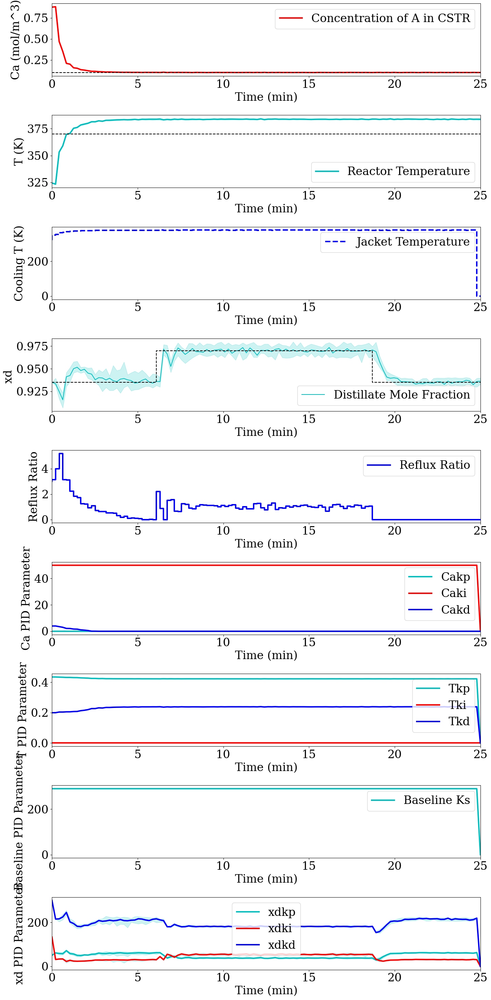

Text(0.5, 1.0, 'Learning Curve')

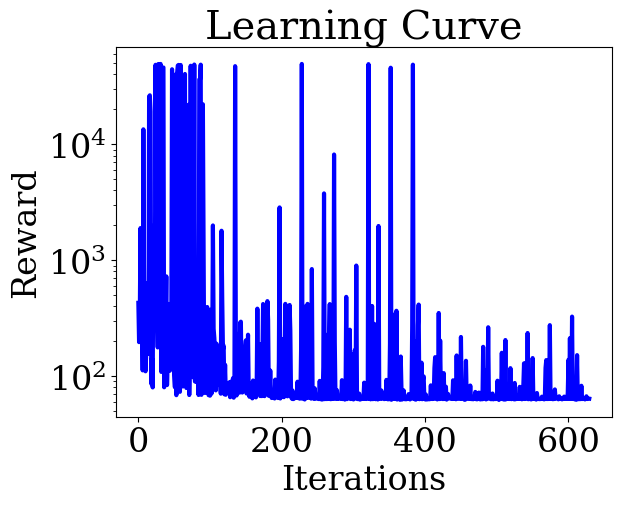

In [204]:
policy = Net(20,5,20,20,torch.nn.Sigmoid,torch.nn.Sigmoid,1,1)
k0     = 7.2e10 # Pre-exponential factor (1/sec)
UA     = 7e5    # U -Heat Transfer Coefficient (W/m^2-K) A -Area - (m^2)
#Training Loop Parameters
params = policy.state_dict()
evals_rs = 10
best_reward = 1e8
r_list = []
p_list = []
r_list_i = []
old_swarm  = 1e8
new_swarm = 0
tol = 1
ns = 120

Ca_des = [0.1 for i in range(ns)]
T_des  = [370 for i in range(ns)]

xd_des1 = np.ones(ns)*0.90
xd_des1[int(ns/2):] = 0.97

xd_des2 = np.ones(ns)*0.97
xd_des2[int(ns/2):] =0.90

xd_des3 = np.ones(ns)*0.97
xd_des3[int(ns/2):] = 0.935

xd_des4 = np.ones(ns)*0.90
xd_des4[int(ns/2):] = 0.97

xd_disturb = np.ones(ns)*0.935
SP = np.array(([Ca_des,T_des,xd_des1],[Ca_des,T_des,xd_des2],[Ca_des,T_des,xd_des3],[Ca_des,T_des,xd_des4],[Ca_des,T_des,xd_disturb]))


#Random Search to find good initial policy
print('Random search to find good initial policy...')
for policy_i in range(evals_rs):
    # sample a random policy
    NNparams_RS  = sample_uniform_params(params, 5, -5)

    # consrict policy to be evaluated
    policy.load_state_dict(NNparams_RS)
    # evaluate policy


    r = criterion_cs2_valid(policy,SP,ns,k0,UA)
    #Store rewards and policies


    #print(policy_i)
    if r < best_reward:
        best_policy = p_list[r_list.index(r)]
        best_reward = r
        init_params= copy.deepcopy(NNparams_RS)

#PSO Optimisation paramters

policy.load_state_dict(init_params)

optim = ParticleSwarmOptimizer(policy.parameters(),
                               inertial_weight=0.1,
                               num_particles=30,
                               max_param_value=5,
                               min_param_value=-5)
#optim = torch.optim.Adam(policy.parameters(),lr = 0.01)



max_iter = 20
policy_list = np.zeros(max_iter)
reward_list = np.zeros(max_iter)
old_swarm = np.zeros(max_iter+1)

i = 0



old_swarm[0] = 1e8

#PSO Training Loop
print('PSO algorithm...')
while abs(best_reward - old_swarm[i]) > tol and i < max_iter:

    if i > 0:
      old_swarm[i] = min(r_list_i)
      del r_list_i[:]
    def closure():
        # Clear any grads from before the optimization step, since we will be changing the parameters
        optim.zero_grad()
        return criterion_cs2_valid(policy,SP,ns,k0,UA)
    optim.step(closure)
    new_swarm = min(r_list)



    if new_swarm < best_reward:
      best_reward = new_swarm
      best_policy = p_list[r_list.index(new_swarm)]
      
      print('New best reward:', best_reward)
    i += 1


#Validation and plotting
reps = 10
ns = 120

Ca_eval = np.zeros((ns, reps))
T_eval = np.zeros((ns, reps))
Tc_eval = np.zeros((ns, reps))
xd_eval = np.zeros((ns, reps))
rr_eval = np.zeros((ns, reps))
ks_react_RL = np.zeros((7,ns,reps))
ks_dist_RL = np.zeros((4,ns,reps))

Ca_des_test = [0.1 for i in range(ns)]
T_des_test  = [370 for i in range(ns)]
xd_des_test = np.ones(ns)*0.935
xd_des_test[int(ns/4):] = 0.97
xd_des_test[int(3*ns/4):] = 0.935

SP_test = np.array([Ca_des_test,T_des_test,xd_des_test])

for r_i in range(reps):
    data = RS_sim(1,policy, ns,SP_test,120,True,False,True,k0,UA)

    Ca_eval[:,r_i] = data['Ca']
    T_eval[:,r_i] = data['T']
    xd_eval[:,r_i] = data['xd']
    rr_eval[:,r_i] = data['rr']
    Tc_eval[:,r_i] = data['Tc']
    ks_react_RL[:,:,r_i] = data['ks_react']
    ks_dist_RL[:,:,r_i] = data['ks_dist']

SP_dist = np.array(([xd_des_test]))
SP_react = np.array([Ca_des_test,T_des_test])
# Plot sim results
plot_simulation_dist(Ca_eval, T_eval, xd_eval,rr_eval,SP_react,SP_dist,Tc_eval,ks_react_RL,ks_dist_RL)

# Plot training performance
plt.plot(list(r_list),'b',lw = 3)
plt.yscale('log')
plt.ylabel('Reward')
plt.xlabel('Iterations')
plt.title('Learning Curve')


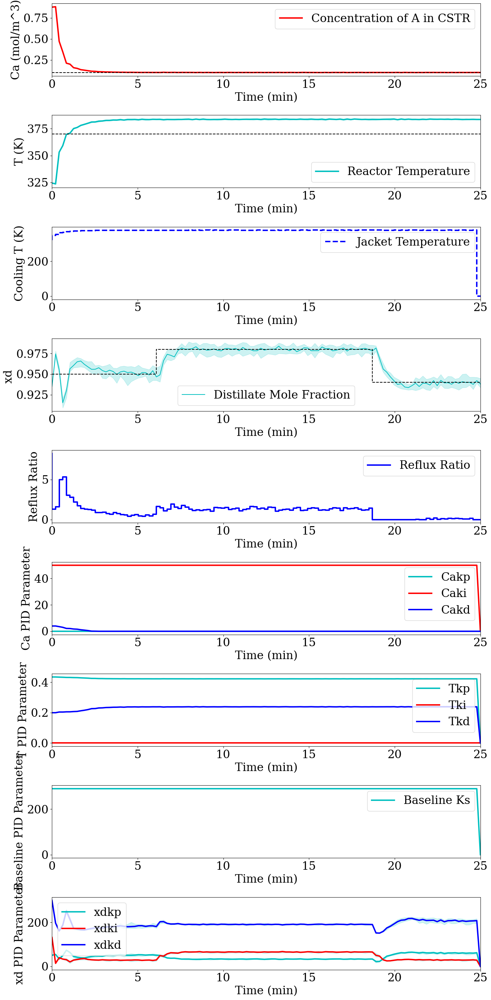

In [211]:
#Validation and plotting
reps = 10
ns = 120

Ca_eval = np.zeros((ns, reps))
T_eval = np.zeros((ns, reps))
Tc_eval = np.zeros((ns, reps))
xd_eval = np.zeros((ns, reps))
rr_eval = np.zeros((ns, reps))
ks_react_RL = np.zeros((7,ns,reps))
ks_dist_RL = np.zeros((4,ns,reps))

Ca_des_test = [0.1 for i in range(ns)]
T_des_test  = [370 for i in range(ns)]
xd_des_test = np.ones(ns)*0.95
xd_des_test[int(ns/4):] = 0.98
xd_des_test[int(3*ns/4):] = 0.94

SP_test = np.array([Ca_des_test,T_des_test,xd_des_test])

for r_i in range(reps):
    data = RS_sim(1,policy, ns,SP_test,120,True,False,True,k0,UA)

    Ca_eval[:,r_i] = data['Ca']
    T_eval[:,r_i] = data['T']
    xd_eval[:,r_i] = data['xd']
    rr_eval[:,r_i] = data['rr']
    Tc_eval[:,r_i] = data['Tc']
    ks_react_RL[:,:,r_i] = data['ks_react']
    ks_dist_RL[:,:,r_i] = data['ks_dist']

SP_dist = np.array(([xd_des_test]))
SP_react = np.array([Ca_des_test,T_des_test])
# Plot sim results
plot_simulation_dist(Ca_eval, T_eval, xd_eval,rr_eval,SP_react,SP_dist,Tc_eval,ks_react_RL,ks_dist_RL)

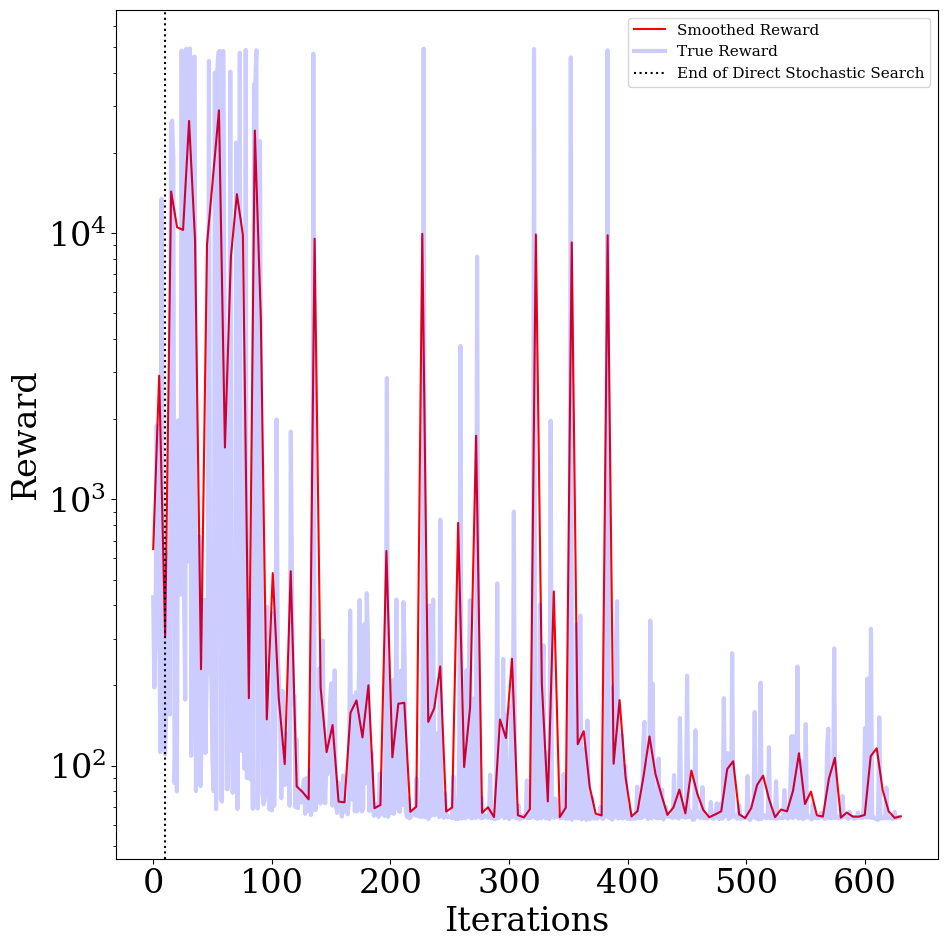

In [285]:
# Plot training performance

def average_5(lst):
    averages = []
    avg_every = 5
    for i in range(0, len(lst), avg_every):
        chunk = lst[i:i+avg_every]
        if len(chunk) == avg_every:
            avg = sum(chunk) / avg_every
            averages.append(avg)
    return averages

r_avg = average_5(r_list)
x = np.linspace(0,len(r_list),len(r_avg))
plt.figure(figsize=(10,10))
plt.plot(x,r_avg,'r', label = 'Smoothed Reward')
plt.plot(list(r_list),'b',lw = 3,alpha = 0.2, label =  'True Reward')
plt.axvline(x=evals_rs, linestyle = 'dotted', color = 'black',label = 'End of Direct Stochastic Search')
plt.yscale('log')
plt.ylabel('Reward')
plt.xlabel('Iterations')
plt.legend(prop={'size':11})
plt.savefig('Learning_Curve_CS2.pdf')
plt.tight_layout()
plt.show()

In [294]:
learning_curve = np.array(r_list)
np.save('learning_curve_CS2.npy',learning_curve)

In [206]:
ISE_Ca = sum((np.median(Ca_eval,axis=1)-Ca_des_test)**2)
ISE_T = sum((np.median(T_eval,axis=1)-T_des_test)**2)
ISE_xd = sum((np.median(xd_eval,axis=1)-xd_des_test)**2)
print(ISE_xd)

0.005464078931105823


# Save the model

In [207]:
torch.save(best_policy.state_dict(),'CS2.pth')
policy.load_state_dict(torch.load('CS2.pth'))

<All keys matched successfully>

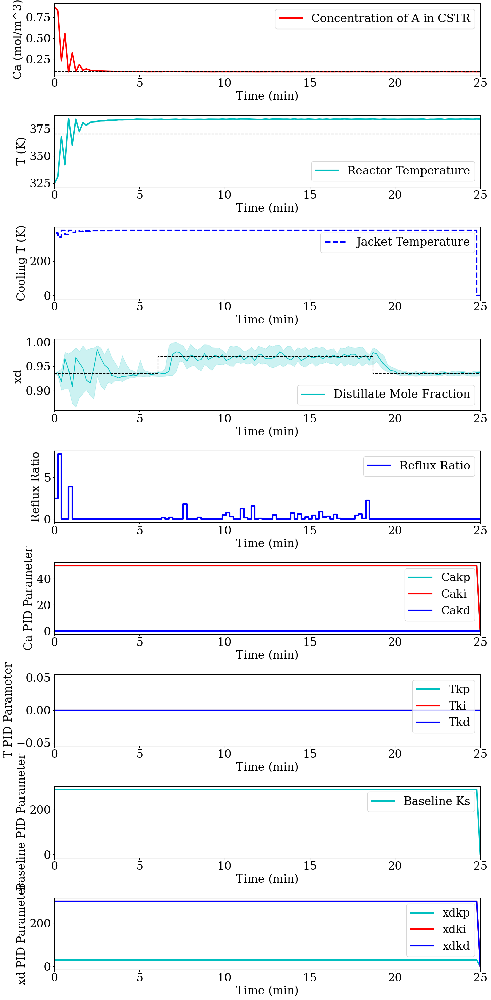

0.016273476169348728


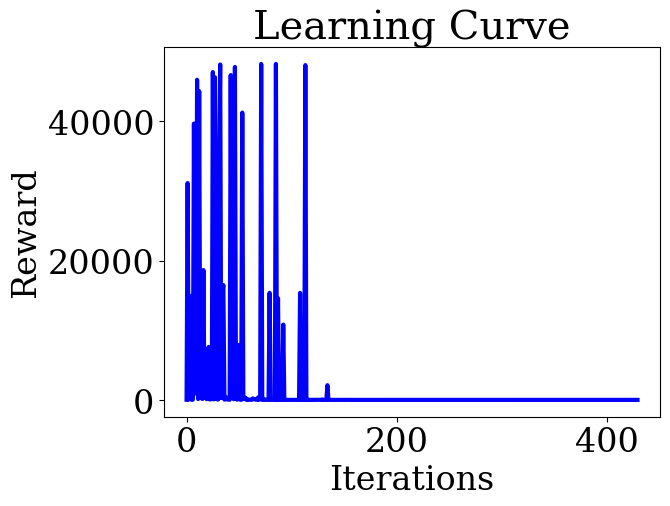

In [194]:

#Validation and plotting
reps = 10
ns = 120

Ca_eval = np.zeros((ns, reps))
T_eval = np.zeros((ns, reps))
Tc_eval = np.zeros((ns, reps))
xd_eval = np.zeros((ns, reps))
rr_eval = np.zeros((ns, reps))
ks_react_RL = np.zeros((7,ns,reps))
ks_dist_RL = np.zeros((4,ns,reps))

Ca_des_test = [0.1 for i in range(ns)]
T_des_test  = [370 for i in range(ns)]
xd_des_test = np.ones(ns)*0.935
xd_des_test[int(ns/4):] = 0.97
xd_des_test[int(3*ns/4):] = 0.935

SP_test = np.array([Ca_des_test,T_des_test,xd_des_test])

for r_i in range(reps):
    data = RS_sim(1,policy, ns,SP_test,120,True,False,True,k0,UA)

    Ca_eval[:,r_i] = data['Ca']
    T_eval[:,r_i] = data['T']
    xd_eval[:,r_i] = data['xd']
    rr_eval[:,r_i] = data['rr']
    Tc_eval[:,r_i] = data['Tc']
    ks_react_RL[:,:,r_i] = data['ks_react']
    ks_dist_RL[:,:,r_i] = data['ks_dist']

SP_dist = np.array(([xd_des_test]))
SP_react = np.array([Ca_des_test,T_des_test])
# Plot sim results
plot_simulation_dist(Ca_eval, T_eval, xd_eval,rr_eval,SP_react,SP_dist,Tc_eval,ks_react_RL,ks_dist_RL)

# Plot training performance
plt.plot(list(r_list),'b',lw = 3)
plt.ylabel('Reward')
plt.xlabel('Iterations')
plt.title('Learning Curve')
ISE_Ca = sum((np.median(Ca_eval,axis=1)-Ca_des_test)**2)
ISE_T = sum((np.median(T_eval,axis=1)-T_des_test)**2)
ISE_xd = sum((np.median(xd_eval,axis=1)-xd_des_test)**2)
print(ISE_xd)

# DFO-PID

In [12]:
def Random_search_cs2(f, n_p, bounds_rs, iter_rs,SP,ns,k0,UA):
    '''
    This function is a naive optimization routine that randomly samples the
    allowed space and returns the best value.

    This is used to find a good starting point for Powell
    '''

    # arrays to store sampled points
    localx   = np.zeros((n_p,iter_rs))  # points sampled
    localval = np.zeros((iter_rs))        # function values sampled
    # bounds
    bounds_range = bounds_rs[:,1] - bounds_rs[:,0]
    bounds_bias  = bounds_rs[:,0]

    for sample_i in range(iter_rs):
        x_trial = np.random.uniform(0, 1, n_p)*bounds_range + bounds_bias # sampling
        localx[:,sample_i] = x_trial
        localval[sample_i] = f(x_trial,1,ns,SP,120,True,True,False,k0,UA) # f
    # choosing the best
    minindex = np.argmin(localval)
    f_b      = localval[minindex]
    x_b      = localx[:,minindex]

    return f_b,x_b

#########################
# --- Powell Method --- #
#########################

# (f, N_x: int, bounds: array[array[float]], N: int = 100) -> array(N_X), float
def opt_Powell_cs2(f, x_dim, bounds, iter_tot,SP,ns,k0,UA):
    '''
    params: parameters that define the rbf model
    X:      matrix of previous datapoints
    '''

    n_rs = int(min(100,max(iter_tot*.05,5)))       # iterations to find good starting point

    # evaluate first point
    f_best, x_best = Random_search_cs2(f, x_dim, bounds, n_rs,SP,ns,k0,UA)
    iter_          = iter_tot - n_rs

    opt = minimize(f, x_best,args = (1,ns,SP,10,True,True,False,k0,UA), bounds=bounds, method='Powell',
                   options={'maxfev': iter_})
    print('PID tuning results')
    print(opt)

    return opt.x, opt.fun

PID tuning results
 message: Optimization terminated successfully.
 success: True
  status: 0
     fun: 28.829545266374076
       x: [ 2.252e+01  1.180e+01  3.015e+01  1.353e-01  1.303e-01
            2.783e-02  3.716e+02  7.639e+01  1.334e+02  7.477e+01
            6.170e+00]
     nit: 3
   direc: [[ 1.000e+00  0.000e+00 ...  0.000e+00  0.000e+00]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00]]
    nfev: 784


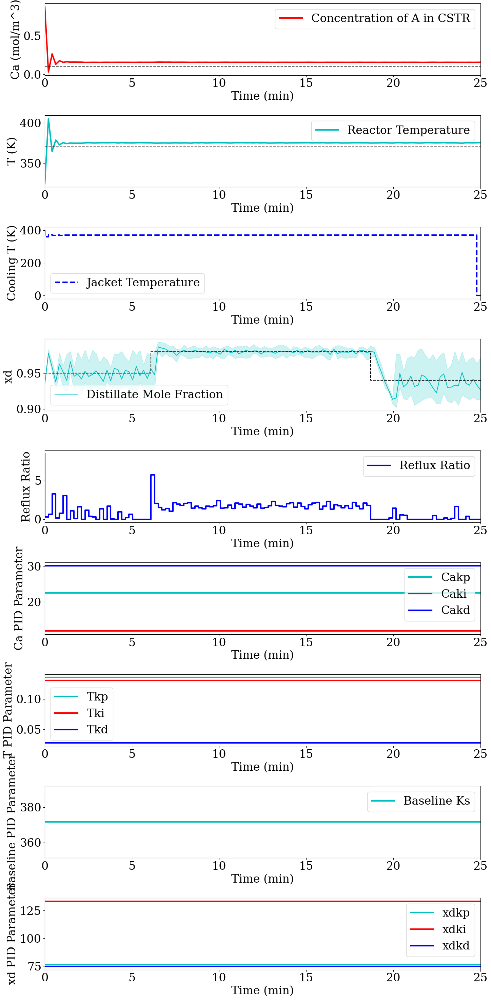

In [222]:
#Optimise PID parameters over whole time period for Case Study 1
#Optimiser Parameters
k0     = 7.2e10 # Pre-exponential factor (1/sec)
UA     = 7e5    # U -Heat Transfer Coefficient (W/m^2-K) A -Area - (m^2)
ns = 120
Ca_des_test = [0.1 for i in range(ns)]
T_des_test  = [370 for i in range(ns)]
xd_des_test = np.ones(ns)*0.95
xd_des_test[int(ns/4):] = 0.98
xd_des_test[int(3*ns/4):] = 0.94
SP_test = np.array([Ca_des_test,T_des_test,xd_des_test])
iter_tot = 1000
boundsKs = np.array([[0,50]]*3+[[0,0.5]]*3+[[280,400]]+[[0,200]]*3+[[0,10]])

#Call optimiser
Ks_opt, f_opt = opt_Powell_cs2(RS_sim, 11, boundsKs, iter_tot, SP_test,ns,k0,UA)
t = np.linspace(0,25,ns)
reps = 10

Ca_ks_eval = np.zeros((ns,reps))
T_ks_eval = np.zeros((ns,reps))
Tc_ks_eval = np.zeros((ns,reps))
xd_ks_eval = np.zeros((ns, reps))
rr_ks_eval = np.zeros((ns, reps))
ks_ks_react = np.tile(Ks_opt[:7],(reps,ns,7)).T
ks_ks_dist = np.tile(Ks_opt[7:],(reps,ns,3)).T
for r_i in range(reps):
    data = RS_sim(Ks_opt,1, ns,SP_test,120,True,True,True,k0,UA)

    Ca_ks_eval[:,r_i] = data['Ca']
    T_ks_eval[:,r_i] = data['T']
    xd_ks_eval[:,r_i] = data['xd']
    rr_ks_eval[:,r_i] = data['rr']
    Tc_ks_eval[:,r_i] = data['Tc']

SP_dist = np.array(([xd_des_test]))
SP_react = np.array([Ca_des_test,T_des_test])
plot_simulation_dist(Ca_ks_eval, T_ks_eval, xd_ks_eval,rr_ks_eval,SP_react,SP_dist,Tc_ks_eval,ks_ks_react,ks_ks_dist)
#Simulate with optimised PID parameters


# Relay-PID

In [14]:
def OnOffController_Tj(e):
  if e < 0:
    Tj = 400
  else:
    Tj = 295
  return Tj

In [15]:
def OnOffController_rr(e):
  if e < 0:
    rr = 10
  else:
    rr = 0
  return rr

In [16]:
def RS_sim_relay(Ks_opt,ns,SP,time_step,disturb,T_controller,ca_controller,xd_controller,k0,UA):
  # == data structures == #
  t  = np.linspace(0,time_step,ns)
  Ks_react_list = np.zeros((7,len(t)))
  Ks_dist_list = np.zeros((3,len(t)))
  e_history = []
  e_history_dist = []
  u = np.zeros((2,len(t)))
  x = np.zeros((34,len(t)))
  ie = np.zeros((len(t)))
  # == Normalisation ==#
  x_norm_react   = np.array([[.8, 315,0, 0],[.1, 10,.1, 20]])
  x_norm_dist = ([[0.96,0.95,0.96],[0.1,0.1,0.1]])

  # == Setpoints == #
  Ca_des = SP[0]
  T_des = SP[1]
  xd_des = SP[2]

  # == Initial states == #
  x_ss =np.array([0.935,0.900,0.862,0.821,0.779,0.738,\
  0.698,0.661,0.628,0.599,0.574,0.553,0.535,0.521,    \
  0.510,0.501,0.494,0.485,0.474,0.459,0.441,0.419,    \
  0.392,0.360,0.324,0.284,0.243,0.201,0.161,0.125,    \
  0.092,0.064])
  for i_s in range(31):
    x[i_s,0] = x_ss[i_s]
  x[32,0] = 0.87725294608097 # Reactor outlet concentration of Component A
  x[33,0] = 324.475443431599 # Temperature inside the CSTR


  # == Initial Controls == #
  u[0,0] = 295 # Jacket temperature
  u[1,0] = 3   # Reflux ratio

  # == Simulation loop == #
  op_hi = 10
  op_lo = 0

  Tf = np.ones(len(t))*350 # Feed Temperature (K)

  if disturb:
      Tf[10:30] = 360
  for i in range(len(t)-1):
    #Time step
    ts      = [t[i],t[i+1]]

    if ca_controller == 'PID':
      SP_react = np.hstack((Ca_des[i],T_des[i]))
      react_state = np.hstack((x[32,i],x[33,i]))

      if i == 0:
          u[0,i]  = PID(Ks_opt, react_state, SP_react, np.array([[0,0]]))
      else:
          u[0,i]  = PID(Ks_opt,react_state, SP_react, np.array(e_history))

    if ca_controller == 'manual':
        u[0,i] = 365

    if ca_controller == 'OnOff':
        e_ca = Ca_des[i] - x[32,i]
        if abs(e_ca) > 0.02:
          u[0,i] = OnOffController_Tj(e_ca)
        else:
          u[0,i] = u[0,i-1]

    if T_controller == 'OnOff':
        e_T = T_des[i] - x[33,i]
        if abs(e_T) > 0.02:
          u[0,i] = OnOffController_Tj(e_T)
        else:
          u[0,i] = u[0,i-1]

    if T_controller == 'PID':
      SP_react = np.hstack((Ca_des[i],T_des[i]))
      react_state = np.hstack((x[32,i],x[33,i]))

      if i == 0:
          u[0,i]  = PID(Ks_opt, react_state, SP_react, np.array([[0,0]]))
      else:
          u[0,i]  = PID(Ks_opt,react_state, SP_react, np.array(e_history))


    e = xd_des[i] - x[0,i]
    delta_t = ts[1]-ts[0]
    if xd_controller == 'manual':
      u[1,i] = 3
    if xd_controller == 'PID':
      Kc = abs(Ks_opt[7])
      tauI = abs(Ks_opt[8])
      tauD = abs(Ks_opt[9])
      kb  = abs(Ks_opt[10])
      Ks_dist = np.array([Kc,tauI,tauD,kb])
      if i == 0:
        u[1,i]  = PID_Dist(Ks_dist, x[0,i], xd_des[i], np.array([0]))
      else:
        u[1,i]  = PID_Dist(Ks_dist,x[0,i], xd_des[i], np.array(e_history_dist))


    if xd_controller == 'OnOff':
        u[1,i] = OnOffController_rr(e)

    #Integrate dynamics
    Tj = u[0,i]
    rr = u[1,i]


    y = odeint(dynamics_CS2,x[:,i],ts,args=(Tj,rr,Tf[i],k0,UA))



    #Assign the t+1 state
    x[:,i+1] = y[-1]

    #Add noise
    x[0,i+1] = x[0,i+1] + np.random.uniform(low=-0.005,high=0.005)
    x[32,i+1] = x[32,i+1] + np.random.uniform(low=-0.001,high=0.001)
    x[33,i+1] = x[33,i+1] + np.random.uniform(low=-.5,high=0.5)

    react_state = np.hstack((x[32,i+1],x[33,i+1]))
    SP_react = np.hstack((Ca_des[i+1],T_des[i+1]))
    e_history.append((SP_react-react_state))
    e_history_dist.append((xd_des[i+1] - x[0,i+1]))

  xd = x[0,:]

  #Caculate reward
  #Penalise control action magnitude
  u_mag = np.abs(u[1,:])/10
  u_mag = np.sum(u[1,:]/10)
  # penalise change in control action
  u_cha = np.abs(u[1,:][1:]-u[1,:][0:-1])/10
  u_cha = np.sum(u_cha/10)

  r_x = sum((xd_des-xd)**2)*100+u_mag+u_cha
  #Return simulation data
  data = {}
  data['states'] = x
  data['T'] = x[33,:]
  data['Ca'] = x[32,:]
  data['Tc'] = u[0,:]
  data['rr'] = u[1,:]
  data['xd'] = xd
  data['control'] = u
  data['ks_react'] = Ks_react_list
  data['ks_dist'] =  Ks_dist_list
  data['r_x'] = r_x
  return data

In [17]:
def PID(Ks, x, x_setpoint, e_history):

    # K gains
    KpCa = Ks[0]; KiCa = Ks[1]; KdCa = Ks[2]
    KpT  = Ks[3]; KiT  = Ks[4]; KdT  = Ks[5]; Kb = Ks[6]
    # setpoint error

    e = x_setpoint - x

    # control action


    u = KpT *e[1] + KiT *sum(e_history[:,1]) + KdT *(e[1]-e_history[-1,1])
    u -= KpCa*e[0] + KiCa*sum(e_history[:,0]) + KdCa*(e[0]-e_history[-1,0])
    u += Kb
    u = min(max(u,200),400)


    return u

In [18]:
def relay_tune(T_controller,ca_controller,dist_controller,Ks,loop,model,k0,UA):
  '''
  Determine PID parameters via the relay tuning method developed by Astrom and Haggland (1984)

  '''
  k0     = 7.2e10 # Pre-exponential factor (1/sec)
  UA     = 7e5    # U -Heat Transfer Coefficient (W/m^2-K) A -Area - (m^2)

  # == Generate Data == #
  ns = 120
  reps = 1
  Ca_des = [0.8 for i in range(ns)] #+ [0.95 for i in range(51)]
  T_des  = [330 for i in range(ns)]
  xd_des = [0.935 for i in range(ns)]
  SP = np.array([Ca_des,T_des,xd_des])

  Ca_dat = np.zeros((ns,reps))
  T_dat = np.zeros((ns,reps))
  Tc_dat = np.zeros((ns,reps))
  xd_dat = np.zeros((ns,reps))
  rr_dat = np.zeros((ns,reps))

  for r_i in range(reps):
    data = model(Ks,ns,SP,120,True,T_controller,ca_controller,dist_controller,k0,UA)
    Ca_dat[:,r_i] = data['Ca']
    T_dat[:,r_i] = data['T']
    Tc_dat[:,r_i] = data['Tc']
    xd_dat[:,r_i] = data['xd']
    rr_dat[:,r_i] = data['rr']

  # == Find peaks and troughs == #
  if loop == 'T':
    peaks, _ = find_peaks(T_dat[:,0], height=0)
    troughs, _= find_peaks(-T_dat[:,0])
  elif loop == 'Ca':
    peaks, _ = find_peaks(Ca_dat[:,0], height=0)
    troughs, _= find_peaks(-Ca_dat[:,0])
  elif loop == 'xd':
    peaks, _ = find_peaks(xd_dat[:,0], height=0)
    troughs, _= find_peaks(-xd_dat[:,0])


  # == Find PID Parameters
  # == Pu ==#
  PU = np.zeros(peaks.shape[0])
  for i in range(peaks.shape[0]-1):
    PU[i]= peaks[i+1]-peaks[i]
  PU = np.trim_zeros(PU)
  Pu_mean = np.mean(PU)

  # == a == #
  a = np.zeros(peaks.shape[0])
  if loop == 'T':
    for i in range(peaks.shape[0]-1):
      a[i]= T_dat[peaks[i],0]-T_dat[troughs[i],0]

    a = np.trim_zeros(a)
    a_mean = np.mean(a)*1000
  if loop == 'xd':
    for i in range(peaks.shape[0]-1):
      a[i]= xd_dat[peaks[i],0]-xd_dat[troughs[i],0]

    a = np.trim_zeros(a)
    a_mean = np.mean(a)*5
  if loop == 'Ca':
    for i in range(peaks.shape[0]-1):
      a[i]= Ca_dat[peaks[i],0]-Ca_dat[troughs[i],0]

    a = np.trim_zeros(a)
    a_mean = np.mean(a)*10



  # == d == #
  if loop == 'Ca' or loop == 'T':
    d = (max(Tc_dat[:,0]) - min(Tc_dat[:,0]))/2
  elif loop == 'xd':
    d = ((10/2))

  # == Ku == #
  Ku = (4*d)/(a_mean * np.pi)

  # == PID Parameters == #
  kc = 0.6*Ku
  tauI = 0.5*Ku/Pu_mean
  tauD = 0.075*Ku*Pu_mean
  ks = np.array([kc,tauI,tauD])
  return ks


In [30]:
# == loop parameters == #
i = 0
tol = 0.01
max_iter = 5
ks_diff = 1e8

# == Data Structures == #
ks_ca = np.zeros((3,max_iter))
ks_T = np.zeros((3,max_iter))
ks_dist  = np.zeros((3,max_iter))

# == Sequential Relay Tuning == #
while ks_diff > tol and i < max_iter: #Check if the change in parameters is significant.
  if i == 0: #Distillation loop in manual and Reactor (T) is tuned using the relay method
    #Set controllers
    dist_controller = 'manual'
    ca_controller = 'manual'
    T_controller = 'OnOff'
    loop = 'T'
    Ks = 1
    #Tune T control loop
    ks_T[:,i] = relay_tune(T_controller,ca_controller,dist_controller,Ks,loop,RS_sim_relay,k0,UA)
    i += 1
  if i > 0:
    #Tune distillation column control loop
    T_controller = 'PID'
    ca_controller = 'PID'
    dist_controller = 'OnOff'
    loop = 'xd'
    Ks = np.array([0,0,0,ks_T[0,i-1],ks_T[1,i-1],ks_T[2,i-1],360,0,0,0,0])
    ks_dist[:,i] = relay_tune(T_controller,ca_controller,dist_controller,Ks,loop,RS_sim_relay,k0,UA)

    #Tune ca control loop
    T_controller = 0
    ca_controller = 'OnOff'
    dist_controller = 'PID'
    loop = 'Ca'
    Ks = np.array([0,0,0,0,0,0,360,ks_dist[0,i-1],ks_dist[1,i-1],ks_dist[2,i-1],3])
    ks_ca[:,i] = relay_tune(T_controller,ca_controller,dist_controller,Ks,loop,RS_sim_relay,k0,UA)


    #Tune reactor control loop
    T_controller = 'OnOff'
    ca_controller = 0
    dist_controller = 'PID'
    loop = 'T'
    Ks = np.array([ks_ca[0,i-1],ks_ca[1,i-1],ks_ca[2,i-1],0,0,0,360,ks_dist[0,i-1],ks_dist[1,i-1],ks_dist[2,i-1],3])
    ks_T[:,i] = relay_tune(T_controller,ca_controller,dist_controller,Ks,loop,RS_sim_relay,k0,UA)

    #ks_diff = (sum(abs(ks_dist[:,i] - ks_dist[:,i-1])) + sum(abs(ks_react[:,i] - ks_react[:,i-1])))/10

    i += 1


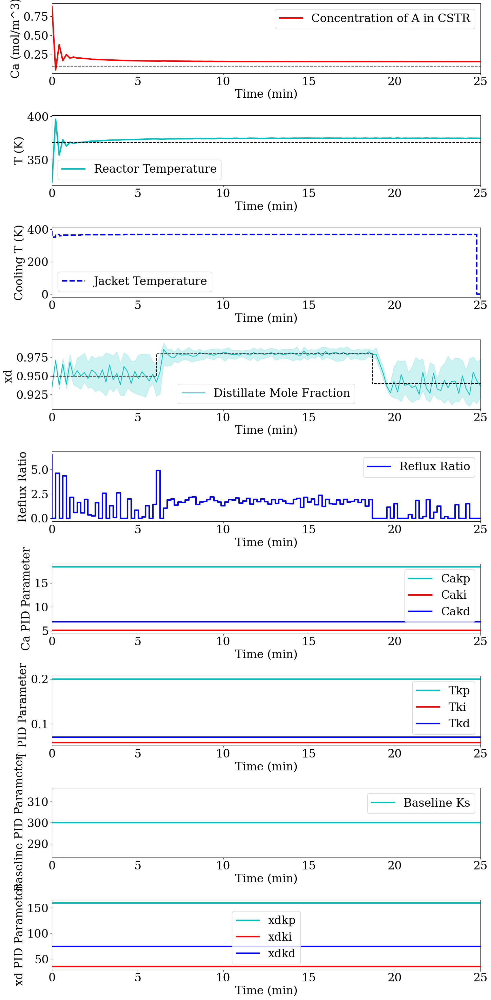

In [229]:
#Validation and plotting
k0     = 7.2e10 # Pre-exponential factor (1/sec)
UA     = 7e5    # U -Heat Transfer Coefficient (W/m^2-K) A -Area - (m^2)
reps = 10
ns = 120

Ca_relay_eval = np.zeros((ns, reps))
T_relay_eval = np.zeros((ns, reps))
Tc_relay_eval = np.zeros((ns, reps))
xd_relay_eval = np.zeros((ns, reps))
rr_relay_eval = np.zeros((ns, reps))


Ca_des_test = [0.1 for i in range(ns)]
T_des_test  = [370 for i in range(ns)]
xd_des_test = np.ones(ns)*0.95
xd_des_test[int(ns/4):] = 0.98
xd_des_test[int(3*ns/4):] = 0.94

SP_test = np.array([Ca_des_test,T_des_test,xd_des_test])

Ks_relay = np.array([ks_ca[0,i-1],ks_ca[1,i-1],ks_ca[2,i-1],ks_T[0,i-1],ks_T[1,i-1],ks_T[2,i-1],360,ks_dist[0,i-1],ks_dist[1,i-1],ks_dist[2,i-1],3])
ks_react_full = np.array([ks_ca[0,i-1],ks_ca[1,i-1],ks_ca[2,i-1],ks_T[0,i-1],ks_T[1,i-1],ks_T[2,i-1],300])
ks_relay_react = np.tile(ks_react_full,(reps,ns,7)).T
ks_relay_dist = np.tile(ks_dist[:,i-1],(reps,ns,3)).T

for r_i in range(reps):
    data = RS_sim_relay(Ks_relay,ns,SP_test,120,True,'PID','PID','PID',k0,UA)

    Ca_relay_eval[:,r_i] = data['Ca']
    T_relay_eval[:,r_i] = data['T']
    xd_relay_eval[:,r_i] = data['xd']
    rr_relay_eval[:,r_i] = data['rr']
    Tc_relay_eval[:,r_i] = data['Tc']


SP_dist = np.array(([xd_des_test]))
SP_react = np.array([Ca_des_test,T_des_test])
# Plot sim results
plot_simulation_dist(Ca_relay_eval, T_relay_eval, xd_relay_eval,rr_relay_eval,SP_react,SP_dist,Tc_relay_eval,ks_relay_react,ks_relay_dist)

In [235]:
print(Ks_relay)

[1.83856995e+01 5.10713874e+00 6.89463730e+00 2.00295172e-01
 5.90841214e-02 7.07292324e-02 3.60000000e+02 1.59383555e+02
 3.53373326e+01 7.48827910e+01 3.00000000e+00]


# NMPC

In [129]:
def NMPC_sim(x,u,k0,UA,i):
    t = np.linspace(0,120,120)
    Tf  = np.ones(len(t)) * 350
    Tf[10:30] = 360
    ts = [t[i],t[i+1]]
    x1 = np.empty(34)
    Tj = u[0]
    rr = u[1]
 
    y = odeint(dynamics_CS2,x,ts,args=(Tj,rr,Tf[i],k0,UA))
    x1 = y[-1]
    x1[0] = x[0] + np.random.uniform(low=-0.005,high=0.005)
    x1[32] = x[32] + np.random.uniform(low=-0.001,high=0.001)
    x1[33] = x[33] + np.random.uniform(low=-.5,high=0.5)
    return x1

In [225]:
def NMPC_CS2(k0_real,UA_real,reps):
  # == Initial States == #
  C_a_0 = 0.2
  T_0 = 330
  T_j_0 = 300
  rr_0 = 3
  t_s = 1
  # == Simulation Parameters and Data Structures == #
  ns = 120
  x0_NMPC_CS2 = np.zeros((34,ns,reps))
  u0_NMPC_CS2 = np.zeros((2,ns,reps))
  y_next = np.zeros((34,ns,reps))



  for r_i in range(reps):
    # ==  Model == #
    # Model type
    model_type = 'continuous'
    model_real = do_mpc.model.Model(model_type,'SX')

    #States
    for i in range(32): #Tray 0-31 mol fraction
      globals()['t_' + str(i)] = model_real.set_variable(var_type='_x', var_name='t_'+str(i), shape=(1,1))

    C_a = model_real.set_variable(var_type='_x', var_name='C_a', shape=(1,1)) # Concentration of A in the reactor
    T = model_real.set_variable(var_type='_x', var_name='T',shape=(1,1)) # Temperature inside the reactor

    #Control inputs
    Tj = model_real.set_variable(var_type='_u', var_name='Tj',shape=(1,1)) # Temperature in the jacket
    rr = model_real.set_variable(var_type='_u',var_name = 'rr',shape = (1,1)) #Reflux ratio


    #TVP
    xd_SP = model_real.set_variable(var_type = '_tvp', var_name = 'xd_SP',shape=(1,1))
    Tf  = model_real.set_variable(var_type='_tvp',var_name = 'Tf',shape=(1,1))
    # == Reactor parameters == #

    Capf   = 1      # Process feed concentration of component A (mol/3)
    q      = 100    # Volumetric Flowrate (m^3/sec)
    V      = 100    # Volume of CSTR (m^3)
    rho    = 1000   # Density of A-B Mixture (kg/m^3)
    rho_M  = 0.2     # Molar density of A-B mix (mol/m3)
    Cp     = 0.239  # Heat capacity of A-B Mixture (J/kg-K)
    mdelH  = 5e4    # Heat of reaction for A->B (J/mol)
    EoverR = 8750   # E -Activation energy (J/mol), R -Constant = 8.31451 J/mol-K
    

    Tf     = 350

    qrf = q
    Caf = 1
    rA     = k0_real*np.exp(-EoverR/T)*C_a # reaction rate



    Cb = (Caf*qrf-C_a*qrf)/qrf
    x_b = Cb*qrf/(Cb*qrf+C_a*qrf)
    x_feed = x_b
    qdf = qrf*rho_M
    # == Distillation Column Parameters == #
    # Vapor Mole Fractions of Component A
    # From the equilibrium assumption and mole balances
    # 1) vol = (yA/xA) / (yB/xB)
    # 2) xA + xB = 1
    # 3) yA + yB = 1

    D=0.5*qdf    # Distillate Flowrate (mol/s)
    B = qdf-D     # Bottoms flowrate (mol/s)
    L=rr*D        # Flowrate of the Liquid in the Rectification Section (mol/s)
    V=L+D         # Vapor Flowrate in the Column (mol/s)
    FL=qrf+L     # Flowrate of the Liquid in the Stripping Section (mol/s)
    vol=1.6         # Relative Volatility = (yA/xA)/(yB/xB) = KA/KB = alpha(A,B)
    atray=3       # Total Molar Holdup in the Condenser
    acond=1       # Total Molar Holdup on each Tray
    areb=0.5      # Total Molar Holdup in the Reboiler
    purge_ratio = 0.5 # Purge ratio

    # == Distillation Column equations == #
    model_real.set_rhs('t_0', 1/acond*V*(globals()['t_' + str(1)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(1)])-t_0),process_noise = True)
    for i in range(1,16):
        model_real.set_rhs('t_'+str(i), 1.0/atray*(L*(globals()['t_' + str(i-1)]-globals()['t_' + str(i)])-V*(globals()['t_' + str(i)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(i)])-globals()['t_' + str(i+1)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(i+1)]))))
    model_real.set_rhs('t_16', 1/atray*(qdf*x_feed+L*t_15-FL*t_16-V*(globals()['t_' + str(16)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(16)])-globals()['t_' + str(17)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(17)]))))
    for i in range(17,31):
        model_real.set_rhs('t_'+str(i), 1.0/atray*(FL*(globals()['t_' + str(i-1)]-globals()['t_' + str(i)])-V*(globals()['t_' + str(i)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(i)])-globals()['t_' + str(i+1)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(i+1)]))))
    model_real.set_rhs('t_31', 1/areb*(FL*t_30-(qdf-D)*t_31-V*globals()['t_' + str(31)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(31)])))
    model_real.set_rhs('C_a', q/V*(Caf - C_a) - rA,process_noise = True )
    model_real.set_rhs('T', q/V*(Tf - T) + mdelH/(rho*Cp)*rA  + UA_real/V/rho/Cp*(Tj-T),process_noise = True )
    model_real.setup()
    
    model = do_mpc.model.Model(model_type,'SX')

    #States
    for i in range(32): #Tray 0-31 mol fraction
      globals()['t_' + str(i)] = model.set_variable(var_type='_x', var_name='t_'+str(i), shape=(1,1))

    C_a = model.set_variable(var_type='_x', var_name='C_a', shape=(1,1)) # Concentration of A in the reactor
    T = model.set_variable(var_type='_x', var_name='T',shape=(1,1)) # Temperature inside the reactor

    #Control inputs
    Tj = model.set_variable(var_type='_u', var_name='Tj',shape=(1,1)) # Temperature in the jacket
    rr = model.set_variable(var_type='_u',var_name = 'rr',shape = (1,1)) #Reflux ratio


    #TVP
    xd_SP = model.set_variable(var_type = '_tvp', var_name = 'xd_SP',shape=(1,1))
    Tf  = model.set_variable(var_type='_tvp',var_name = 'Tf',shape=(1,1))
    # == Reactor parameters == #

    Capf   = 1      # Process feed concentration of component A (mol/3)
    q      = 100    # Volumetric Flowrate (m^3/sec)
    V      = 100    # Volume of CSTR (m^3)
    rho    = 1000   # Density of A-B Mixture (kg/m^3)
    rho_M  = 0.2     # Molar density of A-B mix (mol/m3)
    Cp     = 0.239  # Heat capacity of A-B Mixture (J/kg-K)
    mdelH  = 5e4    # Heat of reaction for A->B (J/mol)
    EoverR = 8750   # E -Activation energy (J/mol), R -Constant = 8.31451 J/mol-K
    k0     = 7.2e10 # Pre-exponential factor (1/sec)
    UA     = 7e5    # U -Heat Transfer Coefficient (W/m^2-K) A -Area - (m^2)

    Tf     = 350

    qrf = q
    Caf = 1
    rA     = k0*np.exp(-EoverR/T)*C_a # reaction rate



    Cb = (Caf*qrf-C_a*qrf)/qrf
    x_b = Cb*qrf/(Cb*qrf+C_a*qrf)
    x_feed = x_b
    qdf = qrf*rho_M
    # == Distillation Column Parameters == #
    # Vapor Mole Fractions of Component A
    # From the equilibrium assumption and mole balances
    # 1) vol = (yA/xA) / (yB/xB)
    # 2) xA + xB = 1
    # 3) yA + yB = 1

    D=0.5*qdf    # Distillate Flowrate (mol/s)
    B = qdf-D     # Bottoms flowrate (mol/s)
    L=rr*D        # Flowrate of the Liquid in the Rectification Section (mol/s)
    V=L+D         # Vapor Flowrate in the Column (mol/s)
    FL=qrf+L     # Flowrate of the Liquid in the Stripping Section (mol/s)
    vol=1.6         # Relative Volatility = (yA/xA)/(yB/xB) = KA/KB = alpha(A,B)
    atray=3       # Total Molar Holdup in the Condenser
    acond=1       # Total Molar Holdup on each Tray
    areb=0.5      # Total Molar Holdup in the Reboiler
    purge_ratio = 0.5 # Purge ratio

    # == Distillation Column equations == #
    model.set_rhs('t_0', 1/acond*V*(globals()['t_' + str(1)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(1)])-t_0),process_noise = True)
    for i in range(1,16):
        model.set_rhs('t_'+str(i), 1.0/atray*(L*(globals()['t_' + str(i-1)]-globals()['t_' + str(i)])-V*(globals()['t_' + str(i)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(i)])-globals()['t_' + str(i+1)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(i+1)]))))
    model.set_rhs('t_16', 1/atray*(qdf*x_feed+L*t_15-FL*t_16-V*(globals()['t_' + str(16)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(16)])-globals()['t_' + str(17)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(17)]))))
    for i in range(17,31):
        model.set_rhs('t_'+str(i), 1.0/atray*(FL*(globals()['t_' + str(i-1)]-globals()['t_' + str(i)])-V*(globals()['t_' + str(i)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(i)])-globals()['t_' + str(i+1)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(i+1)]))))
    model.set_rhs('t_31', 1/areb*(FL*t_30-(qdf-D)*t_31-V*globals()['t_' + str(31)] * vol/(1.0+(vol-1.0)*globals()['t_' + str(31)])))
    model.set_rhs('C_a', q/V*(Caf - C_a) - rA,process_noise = True )
    model.set_rhs('T', q/V*(Tf - T) + mdelH/(rho*Cp)*rA  + UA/V/rho/Cp*(Tj-T),process_noise = True )
    model.setup()

    # == Controller == #
    mpc = do_mpc.controller.MPC(model)
    setup_mpc = {
        'n_horizon': 5,
        'n_robust': 0,
        'open_loop': 0,
        't_step': t_s,
        'state_discretization': 'collocation',
        'collocation_type': 'radau',
        'collocation_deg': 2,
        'collocation_ni': 2,
        'store_full_solution': True,

    }

    mpc.set_param(**setup_mpc)

    # mpc.scaling['_x', 'T'] = 100
    # mpc.scaling['_u', 'Tj'] = 100
    # mpc.scaling['_u', 'rr'] = 10
    _x = model.x
    lterm =  ((_x['t_0']-model.tvp['xd_SP']))**2
    mterm = DM(0)

    ns = 120
    mpc.set_objective(mterm=mterm, lterm=lterm)

    mpc.set_rterm() # input penalty
    tvp_template_mpc = mpc.get_tvp_template()

    Tf_arr = np.ones(ns+1000)*350
    Tf_arr[10:30] = 360
    def tvp_fun(t_now):
      t_now = t_now/t_s

      xd_des_test = [0.95 for i in range(int(ns/4))] + [0.98 for i in range(int(2*ns/4))] + [0.94 for i in range(int(ns/4)+1000)]
      #print(T_des_test[int(t_now+k)])
      for k in range(setup_mpc['n_horizon']):
        tvp_template_mpc['_tvp',k,'xd_SP'] = xd_des_test[int(t_now+k)]
        tvp_template_mpc['_tvp',k,'Tf'] = Tf_arr[int(t_now+k)]
      return tvp_template_mpc

    mpc.set_tvp_fun(tvp_fun)
    # lower bounds of the states
    for i in range(32):
      mpc.bounds['lower','_x','t_'+str(i)] = 0


    mpc.bounds['lower', '_x', 'C_a'] = 0
    mpc.bounds['lower', '_x', 'T'] = 0

    # upper bounds of the states
    for i in range(32):
        mpc.bounds['upper','_x','t_'+str(i)] = 1
    mpc.bounds['upper', '_x', 'C_a'] = 3
    mpc.bounds['upper', '_x', 'T'] = 800


    # lower bounds of the inputs
    mpc.bounds['lower', '_u', 'Tj'] = 200
    mpc.bounds['lower', '_u', 'rr'] = 0

    # upper bounds of the inputs
    mpc.bounds['upper', '_u', 'Tj'] = 400
    mpc.bounds['upper','_u','rr'] = 10
    mpc.setup()

    # == Estimator == #
    estimator = do_mpc.estimator.StateFeedback(model_real)

    # == Simulator == #
    simulator = do_mpc.simulator.Simulator(model_real)
    params_simulator = {
        'integration_tool': 'cvodes',
        'abstol': 1e-10,
        'reltol': 1e-10,
        't_step': t_s,

    }
    tvp_template = simulator.get_tvp_template()


    def tvp_fun(t_now):
      t_now = t_now/t_s
      xd_des_test = [0.95 for i in range(int(ns/4))] + [0.98 for i in range(int(2*ns/4))] + [0.94 for i in range(int(ns/4)+1000)]
      tvp_template['xd_SP'] = xd_des_test[int(t_now)]
      tvp_template['Tf'] = Tf_arr[int(t_now)]
      return tvp_template

    # Set the tvp_fun:
    simulator.set_tvp_fun(tvp_fun)
    simulator.set_param(**params_simulator)
    simulator.setup()

    # == Initial Conditions
    x0 = np.array([0.935,0.900,0.862,0.821,0.779,0.738,\
    0.698,0.661,0.628,0.599,0.574,0.553,0.535,0.521,    \
    0.510,0.501,0.494,0.485,0.474,0.459,0.441,0.419,    \
    0.392,0.360,0.324,0.284,0.243,0.201,0.161,0.125,    \
    0.092,0.064,C_a_0,T_0]).reshape(34,1)

    mpc.x0 = x0
    simulator.x0 = x0
    estimator.x0 = x0

    mpc.set_initial_guess()
    # == Closed-loop Simulation == #
    for k in range(ns-1):
      if k == 0:
        u0_NMPC_CS2[:,k,r_i] = mpc.make_step(x0).reshape(2)
        x0_NMPC_CS2[:,k,r_i] = x0.reshape(34)
      else:
        u0_NMPC_CS2[:,k,r_i] = mpc.make_step(x0_NMPC_CS2[:,k,r_i]).reshape(2)
      Ca_noise = np.random.uniform(low=-0.001,high=0.001)
      T_noise = np.random.uniform(low=-.5,high=0.5)
      xd_noise = np.random.uniform(low=-0.005,high=0.005)
      w0 = np.array([xd_noise,Ca_noise,T_noise]).reshape(3,1)
      y_next[:,k,r_i] = simulator.make_step(u0_NMPC_CS2[:,k,r_i].reshape(2,1),w0 = w0).reshape(34)
      x0_NMPC_CS2[:,k+1,r_i] = estimator.make_step(y_next[:,k,r_i])
      #x0_NMPC_CS2[:,k+1,r_i] = NMPC_sim(x0_NMPC_CS2[:,k,r_i],u0_NMPC_CS2[:,k,r_i],k0_real,UA_real,k)
  return x0_NMPC_CS2,u0_NMPC_CS2

# Comparison

In [22]:
def plot_comparison_cs2(Ca_dat, T_dat, Tc_dat,xd_dat,rr_dat,SP,ns,ks_react, ks_dist,savefig):

    Ca_des = SP[0]
    T_des  = SP[1]
    xd_des = SP[2]
    t = np.linspace(0,26,119)
    t_NMPC = np.linspace(0,26,Ca_dat[3].shape[0])
    plt.figure(figsize=(30, 28))
    plt.rc('font',family = 'serif')
    plt.rcParams.update({'font.size':24})
    plt.rcParams.update({"mathtext.fontset":'cm'})
    
    ax1 = plt.subplot(911)
    plt.plot(t, np.median(Ca_dat[0][:-1],axis=1), 'r-', lw=2, label = 'RL-PID')
    plt.gca().fill_between(t, np.min(Ca_dat[0][:-1],axis=1), np.max(Ca_dat[0][:-1],axis=1),
                           color='r', alpha=0.2)
    plt.plot(t, np.median(Ca_dat[1][:-1],axis=1), 'b-', lw=2, label = 'DFO-PID')
    plt.gca().fill_between(t, np.min(Ca_dat[1][:-1],axis=1), np.max(Ca_dat[1][:-1],axis=1),
                           color='b', alpha=0.2)
    plt.plot(t, np.median(Ca_dat[2][:-1],axis=1), 'g-', lw=2,label = 'Relay-PID')
    plt.gca().fill_between(t, np.min(Ca_dat[2][:-1],axis=1), np.max(Ca_dat[2][:-1],axis=1),
                           color='g', alpha=0.2)
    plt.plot(t_NMPC[:-1], np.median(Ca_dat[3][:-1],axis=1), 'c-', lw=2,label = 'NMPC')
    plt.gca().fill_between(t_NMPC[:-1], np.min(Ca_dat[3][:-1],axis=1), np.max(Ca_dat[3][:-1],axis=1),
                           color='c', alpha=0.2)
    plt.step(t, Ca_des[:-1], '--', lw=1.5, color='black')
    plt.ylabel('$C_A$ [mol/m$^3$]')
    #plt.xlabel('Time [min]')
    plt.legend(loc='upper right', prop = {'size':17})
    plt.tick_params('x', labelbottom = False)
    plt.xlim(min(t), max(t))

    plt.subplot(912,sharex = ax1)
    plt.plot(t, np.median(T_dat[0][:-1],axis=1), 'r-', lw=2,label = 'RL-PID')
    plt.gca().fill_between(t, np.min(T_dat[0][:-1],axis=1), np.max(T_dat[0][:-1],axis=1),
                           color='r', alpha=0.2)

    plt.plot(t, np.median(T_dat[1][:-1],axis=1), 'b-', lw=2, label = 'DFO-PID')
    plt.gca().fill_between(t, np.min(T_dat[1][:-1],axis=1), np.max(T_dat[1][:-1],axis=1),
                           color='b', alpha=0.2)
    plt.plot(t, np.median(T_dat[2][:-1],axis=1), 'g-', lw=2,label = 'Relay-PID')
    plt.gca().fill_between(t, np.min(T_dat[2][:-1],axis=1), np.max(T_dat[2][:-1],axis=1),
                           color='g', alpha=0.2)
    plt.plot(t_NMPC[:-1], np.median(T_dat[3][:-1],axis=1), 'c-', lw=2,label = 'NMPC')
    plt.gca().fill_between(t_NMPC[:-1], np.min(T_dat[3][:-1],axis=1), np.max(T_dat[3][:-1],axis=1),
                           color='c', alpha=0.2)
    plt.step(t, T_des[:-1], '--', lw=1.5, color='black')
    plt.ylabel('$T$ [K]')
    #plt.xlabel('Time [min]')
    plt.tick_params('x', labelbottom = False)
    #plt.legend(loc='upper left')
    plt.xlim(min(t), max(t))

    plt.subplot(913,sharex = ax1)
    plt.step(t, np.median(Tc_dat[0][:-1],axis=1), 'r--', lw=2,label = 'RL-PID')
    plt.step(t, np.median(Tc_dat[1][:-1],axis=1), 'b--', lw=2, label = 'DFO-PID')
    plt.step(t, np.median(Tc_dat[2][:-1],axis=1), 'g--', lw=2,label = 'Relay-PID')
    plt.step(t_NMPC[:-1], np.median(Tc_dat[3][:-1],axis=1), 'c--', lw=2,label = 'NMPC')
    plt.ylabel('$T_J$ [K]')
    #plt.xlabel('Time [min]')
    plt.tick_params('x', labelbottom = False)
    #plt.legend(loc='upper left')
    plt.xlim(min(t), max(t))


    plt.subplot(914,sharex = ax1)
    plt.plot(t, np.median(xd_dat[0][:-1],axis=1), 'r-', lw=2,label = 'RL-PID')
    plt.gca().fill_between(t, np.min(xd_dat[0][:-1],axis=1), np.max(xd_dat[0][:-1],axis=1),
                           color='r', alpha=0.2)

    plt.plot(t, np.median(xd_dat[1][:-1],axis=1), 'b-', lw=2, label = 'DFO-PID')
    plt.gca().fill_between(t, np.min(xd_dat[1][:-1],axis=1), np.max(xd_dat[1][:-1],axis=1),
                           color='b', alpha=0.2)
    plt.plot(t, np.median(xd_dat[2][:-1],axis=1), 'g-', lw=2,label = 'Relay-PID')
    plt.gca().fill_between(t, np.min(xd_dat[2][:-1],axis=1), np.max(xd_dat[2][:-1],axis=1),
                           color='g', alpha=0.2)
    plt.plot(t_NMPC[:-1], np.median(xd_dat[3][:-1],axis=1), 'c-', lw=2,label = 'NMPC')
    plt.gca().fill_between(t_NMPC[:-1], np.min(xd_dat[3][:-1],axis=1), np.max(xd_dat[3][:-1],axis=1),
                           color='c', alpha=0.2)
    plt.step(t, xd_des[:-1], '--', lw=1.5, color='black')
    plt.ylabel('$x_{B,D}$')
    #plt.xlabel('Time [min]')
    #plt.legend(loc='upper left')
    plt.tick_params('x', labelbottom = False)
    plt.xlim(min(t), max(t))

    plt.subplot(915,sharex = ax1)
    plt.step(t, np.median(rr_dat[0][:-1],axis=1), 'r--', lw=2,label = 'RL-PID')
    plt.step(t, np.median(rr_dat[1][:-1],axis=1), 'b--', lw=2, label = 'DFO-PID')
    plt.step(t, np.median(rr_dat[2][:-1],axis=1), 'g--', lw=2,label = 'Relay-PID')
    plt.step(t_NMPC[:-1], np.median(rr_dat[3][:-1],axis=1), 'c--', lw=2,label = 'NMPC')
    plt.ylabel('R$_R$')
    #plt.xlabel('Time [min]')
    plt.tick_params('x', labelbottom = False)
    #plt.legend(loc='upper right')
    plt.xlim(min(t), max(t))
    
    labels = ['K$_p$','K$_i$','K$_d$','K$_p$','K$_I$','K$_d$']
    col = ['c-','r-','b-','c-','r-','b-']
    col_fill = ['c','r','b','c','r','b']
    plt.subplot(916,sharex = ax1)
    for ks_i in range(3):
      plt.plot(t, np.median(ks_react[ks_i,:,:][:-1],axis=1), col[ks_i], lw=3,label = labels[ks_i])
      plt.gca().fill_between(t, np.min(ks_react[ks_i,:,:][:-1],axis=1), np.max(ks_react[ks_i,:,:][:-1],axis=1),
                              color=col_fill[ks_i], alpha=0.2)
    plt.ylabel('C$_A$')
    #plt.xlabel('Time (min)')
    plt.legend(loc='upper right',prop = {'size':22})
    plt.title('PID Parameters')
    plt.tick_params('x', labelbottom = False)
    plt.xlim(min(t), max(t))

    plt.subplot(917,sharex = ax1)
    i = [3,4,5]
    for ks_i in i:
      plt.plot(t, np.median(ks_react[ks_i,:,:][:-1],axis=1), col[ks_i], lw=3,label = labels[ks_i])
      plt.gca().fill_between(t, np.min(ks_react[ks_i,:,:][:-1],axis=1), np.max(ks_react[ks_i,:,:][:-1],axis=1),
                              color=col_fill[ks_i], alpha=0.2)
    plt.ylabel('T')
    #plt.xlabel('Time (min)')
    #plt.legend(loc='best')
    plt.tick_params('x', labelbottom = False)
    plt.xlim(min(t), max(t))


    
    col_dist = ['c-','r-','b-']
    plt.subplot(918,sharex = ax1)
    for ks_i in range(3):
      plt.plot(t, np.median(ks_dist[ks_i,:,:][:-1],axis=1), col_dist[ks_i], lw=3,label = labels[ks_i])
      plt.gca().fill_between(t, np.min(ks_dist[ks_i,:,:][:-1],axis=1), np.max(ks_dist[ks_i,:,:][:-1],axis=1),
                              color=col_fill[ks_i], alpha=0.2)
    plt.ylabel(r'$x_{B,D}$')
    plt.xlabel('Time [min]')
    #plt.legend(loc='best')
    plt.xlim(min(t), max(t))



    plt.tight_layout()
    if savefig == True:
        plt.savefig('CS2.pdf')
    plt.show()

In [226]:
#Plot to compare RL, DFO and Relay
k0     = 7.2e10 # Pre-exponential factor (1/sec)
UA     = 7e5    # U -Heat Transfer Coefficient (W/m^2-K) A -Area - (m^2)
x0_NMPC_CS2, u0_NMPC_CS2 = NMPC_CS2(k0,UA,10)

C:\Users\mfb22\AppData\Local\Temp\ipykernel_8280\1870709226.py:201: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  tvp_template_mpc['_tvp',k,'xd_SP'] = xd_des_test[int(t_now+k)]
C:\Users\mfb22\AppData\Local\Temp\ipykernel_8280\1870709226.py:202: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  tvp_template_mpc['_tvp',k,'Tf'] = Tf_arr[int(t_now+k)]


This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     5094
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:     1355

Total number of variables............................:     1438
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      962
                     variables with only upper bounds:        0
Total number of equality constraints.................:     1224
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.1250000e-03 1.85e+04 2.40e-05  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

C:\Users\mfb22\AppData\Local\Temp\ipykernel_8280\1870709226.py:248: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  tvp_template['xd_SP'] = xd_des_test[int(t_now)]
C:\Users\mfb22\AppData\Local\Temp\ipykernel_8280\1870709226.py:249: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  tvp_template['Tf'] = Tf_arr[int(t_now)]


  22  6.3397675e-02 3.36e+02 1.79e-01  -2.5 1.76e+01  -5.0 5.49e-01 9.61e-01h  1
  23  3.1745325e-02 3.26e+02 1.71e-01  -2.5 1.68e+02  -5.5 7.48e-03 1.66e-02H  1
  24  4.0665003e-02 3.58e+02 5.43e-02  -2.5 9.21e+01  -5.9 3.11e-01 2.98e-01h  2
  25  4.6799336e-02 2.42e+02 1.37e-01  -2.5 1.99e+01  -3.7 8.67e-01 3.17e-01h  1
  26  6.2315420e-02 1.96e+01 5.12e-02  -2.5 1.39e+01  -4.2 1.00e+00 1.00e+00h  1
  27  6.2838300e-02 2.18e+00 1.74e-02  -2.5 7.95e+00  -4.7 1.00e+00 1.00e+00h  1
  28  6.2398945e-02 2.29e+01 4.01e-02  -2.5 1.35e+01  -5.1 1.00e+00 1.00e+00h  1
  29  6.2097546e-02 3.92e+00 4.82e-03  -2.5 6.93e+00  -5.6 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  6.2197595e-02 9.08e-01 1.08e-02  -2.5 1.92e+01  -6.1 1.00e+00 1.00e+00h  1
  31  6.2094008e-02 2.00e-02 1.04e-04  -2.5 2.30e+00  -4.8 1.00e+00 1.00e+00h  1
  32  5.4566951e-02 3.62e-01 5.55e-02  -3.8 1.66e+00  -5.2 9.54e-01 7.77e-01h  1
  33  5.2702298e-02 1.59e+00

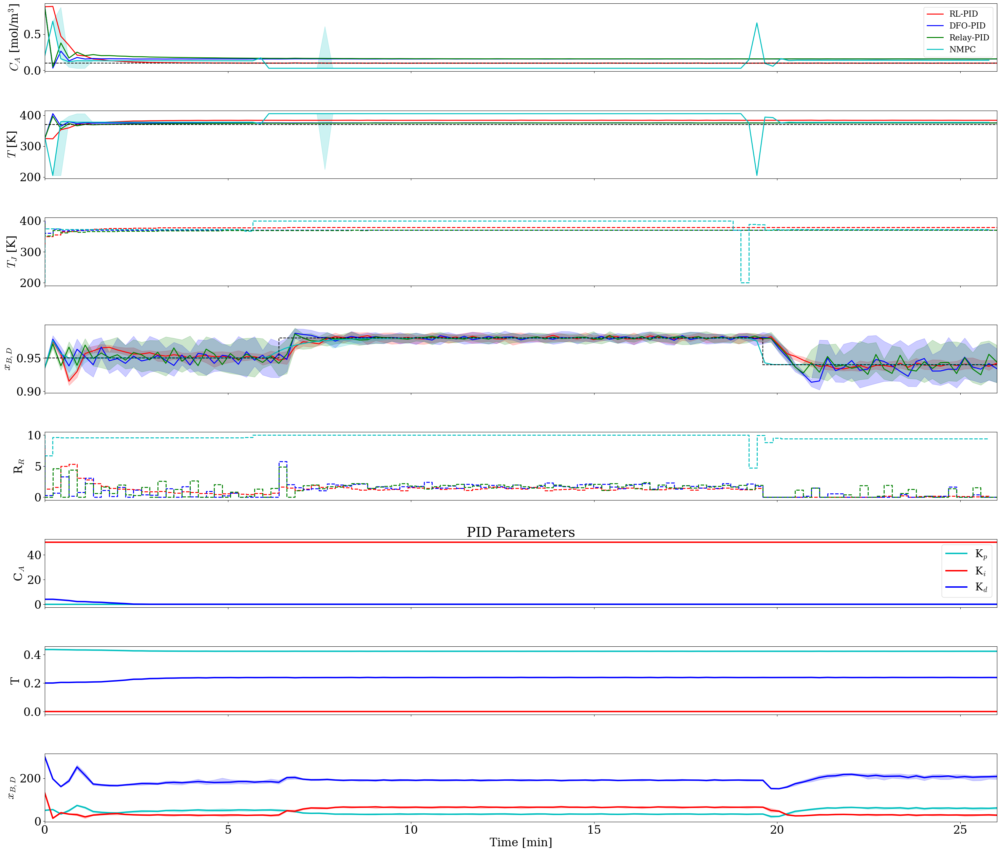

=== Ca-ISE ===
RL-PID : 1.444
DFO-PID : 1.025
Relay-PID : 1.207
NMPC : 1.032
=== T-ISE ===
RL-PID : 25106.107
DFO-PID : 6510.995
Relay-PID : 5390.103
NMPC : 133423.216
=== xd-ISE ===
RL-PID : 0.0083
DFO-PID : 0.0093
Relay-PID : 0.0085
NMPC : 0.0017
=== Ca-IAE ===
RL-PID : 2.687
DFO-PID : 7.744
Relay-PID : 8.754
NMPC : 7.576
=== T-IAE ===
RL-PID : 1641.369
DFO-PID : 693.212
Relay-PID : 597.876
NMPC : 2903.778
=== xd-IAE ===
RL-PID : 0.523
DFO-PID : 0.669
Relay-PID : 0.651
NMPC : 0.143


In [231]:
Ca_dat = np.array([Ca_eval,Ca_ks_eval,Ca_relay_eval,x0_NMPC_CS2[32,:,:]])
T_dat = np.array([T_eval,T_ks_eval,T_relay_eval,x0_NMPC_CS2[33,:,:]])
Tc_dat = np.array([Tc_eval,Tc_ks_eval,Tc_relay_eval,u0_NMPC_CS2[0,:,:]])
xd_dat = np.array([xd_eval,xd_ks_eval,xd_relay_eval,x0_NMPC_CS2[0,:,:]])
rr_dat = np.array([rr_eval,rr_ks_eval,rr_relay_eval,u0_NMPC_CS2[1,:,:]])

ns = 120
Ca_des_test = [0.1 for i in range(ns)]
T_des_test  = [370 for i in range(ns)]
xd_des_test = np.ones(ns)*0.95
xd_des_test[int(ns/4):] = 0.98
xd_des_test[int(3*ns/4):] = 0.94

SP_test = np.array([Ca_des_test,T_des_test,xd_des_test])

plot_comparison_cs2(Ca_dat, T_dat, Tc_dat,xd_dat,rr_dat,SP_test,ns,ks_react_RL,ks_dist_RL,True)

IAE_Ca = np.zeros(4)
IAE_T = np.zeros_like(IAE_Ca)
IAE_xd = np.zeros_like(IAE_Ca)
ISE_Ca = np.zeros(4)
ISE_T = np.zeros_like(IAE_Ca)
ISE_xd = np.zeros_like(IAE_Ca)
methods = ['RL-PID','DFO-PID','Relay-PID','NMPC']
for i in range(4):
  ISE_Ca[i] = sum((np.median(Ca_dat[i],axis=1)-Ca_des_test)**2)
  ISE_T[i] = sum((np.median(T_dat[i],axis=1)-T_des_test)**2)
  ISE_xd[i] = sum((np.median(xd_dat[i],axis=1)-xd_des_test)**2)
  IAE_Ca[i] = sum(np.abs(np.median(Ca_dat[i],axis=1)-Ca_des_test))
  IAE_T[i] = sum(np.abs(np.median(T_dat[i],axis=1)-T_des_test))
  IAE_xd[i] = sum(np.abs(np.median(xd_dat[i],axis=1)-xd_des_test))
print('=== Ca-ISE ===')
for i in range(4):
   print(methods[i],':',round(ISE_Ca[i],3))
print('=== T-ISE ===')
for i in range(4):
  print(methods[i],':',round(ISE_T[i],3))
print('=== xd-ISE ===')
for i in range(4):
  print(methods[i],':',round(ISE_xd[i],4))
print('=== Ca-IAE ===')
for i in range(4):
   print(methods[i],':',round(IAE_Ca[i],3))
print('=== T-IAE ===')
for i in range(4):
  print(methods[i],':',round(IAE_T[i],3))
print('=== xd-IAE ===')
for i in range(4):
  print(methods[i],':',round(IAE_xd[i],3))

In [292]:
time_series_data = np.array((Ca_dat,T_dat,Tc_dat,rr_dat,xd_dat,ks_react_RL,ks_dist_RL),dtype=object)

np.save('time_series_data_CS2.npy',time_series_data)

# Parametric Drift

In [256]:
%%capture
k0 = np.linspace(0.1e10,7.2e10,20)
UA = 7e5
reps = 3
IAE_Ca_k0 = np.zeros((k0.shape[0],4,reps))
IAE_T_k0 = np.zeros_like(IAE_Ca_k0)
IAE_xd_k0 = np.zeros_like(IAE_Ca_k0)

Ca_des_test = [0.1 for i in range(ns)]
T_des_test  = [370 for i in range(ns)]
xd_des_test = np.ones(ns)*0.95
xd_des_test[int(ns/4):] = 0.98
xd_des_test[int(3*ns/4):] = 0.94

SP = np.array([Ca_des_test,T_des_test,xd_des_test])
for r_i in range(reps):
  for i in range(k0.shape[0]):
      data_RL_k0 = RS_sim(0,best_policy,120,SP,120,True,False,True,k0[i],UA) #Disturbance active
      data_Ks_relay_k0 = RS_sim(Ks_relay,1,120,SP,120,True,True,True,k0[i],UA)
      data_KsOpt_k0 = RS_sim(Ks_opt,1,120,SP,120,True,True,True,k0[i],UA)

      Ca_eval_k0 = data_RL_k0['Ca']
      T_eval_k0 = data_RL_k0['T']
      Tc_eval_k0 = data_RL_k0['Tc']
      xd_eval_k0 = data_RL_k0['xd']

      Ca_relay_eval_k0 = data_Ks_relay_k0['Ca']
      T_relay_eval_k0 = data_Ks_relay_k0['T']
      Tc_relay_eval_k0 = data_Ks_relay_k0['Tc']
      xd_relay_eval_k0 = data_Ks_relay_k0['xd']

      Ca_ks_eval_k0 = data_KsOpt_k0['Ca']
      T_ks_eval_k0 = data_KsOpt_k0['T']
      Tc_ks_eval_k0 = data_KsOpt_k0['Tc']
      xd_ks_eval_k0 = data_KsOpt_k0['xd']
      x0_NMPC_CS2_k0,u0_NMPC_CS2_k0= NMPC_CS2(k0[i],UA,1)
      print('UA:',UA)

      methods = ['RL-PID','DFO-PID','Relay-PID','NMPC']
      Ca_dat_k0 = np.array([data_RL_k0['Ca'],data_KsOpt_k0['Ca'],data_Ks_relay_k0['Ca'],x0_NMPC_CS2_k0[32,:,0]])
      T_dat_k0 = np.array([data_RL_k0['T'],data_KsOpt_k0['T'],data_Ks_relay_k0['T'],x0_NMPC_CS2_k0[33,:,0]])
      xd_dat_k0 = np.array([data_RL_k0['xd'],data_KsOpt_k0['xd'],data_Ks_relay_k0['xd'],x0_NMPC_CS2_k0[0,:,0]])
      
      for i_ISE in range(4):
        IAE_Ca_k0[i,i_ISE,r_i] = sum((Ca_dat_k0[i_ISE]-Ca_des_test)**2)
        IAE_T_k0[i,i_ISE,r_i] = sum((T_dat_k0[i_ISE]-T_des_test)**2)
        IAE_xd_k0[i,i_ISE,r_i] = sum((xd_dat_k0[i_ISE]-xd_des_test)**2)

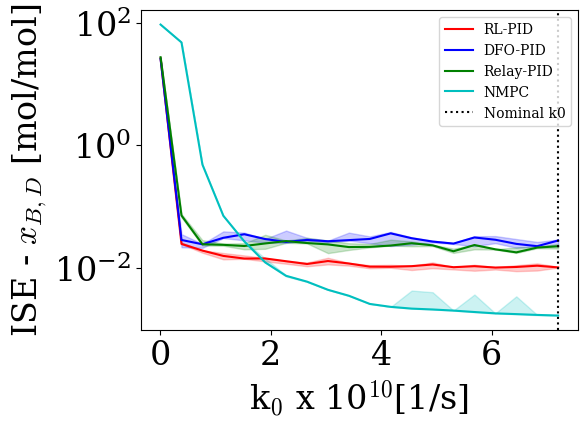

In [286]:
# plt.figure()
# plt.plot(k0,IAE_Ca_k0,label = methods)
# plt.axvline(x = 7.2e10, color = 'b', label = 'Nominal k0')
# plt.xlabel('k0')
# plt.ylabel('ISE - $C_A$')
# plt.legend()
# plt.show()

# plt.figure()
# plt.axvline(x = 7.2e10, color = 'b', label = 'Nominal k0')
# plt.plot(k0,IAE_T_k0,label = methods)
# plt.ylabel('ISE - $T$')
# plt.xlabel('k0')
# plt.legend()
# plt.show()

# small_methods = ['RL-PID','DFO-PID','Relay-PID']

# plt.figure()
# plt.axvline(x = 7.2e10, color = 'b', label = 'Nominal k0')
# plt.plot(k0,IAE_xd_k0,label = methods)
# plt.ylabel('ISE - $x_d$')
# plt.xlabel('k0')
# plt.legend(prop={'size':10})
# plt.show()

k0 = np.linspace(1e8,7.2e10,20)
col = ['r','b','g','c']
plt.figure()

for i in range(4):
    plt.plot(k0/1e10,np.median(IAE_xd_k0[:,i,:],axis = 1),color = col[i],label = methods[i])
    plt.gca().fill_between(k0/1e10, np.min(IAE_xd_k0[:,i,:],axis=1), np.max(IAE_xd_k0[:,i,:],axis=1),color = col[i],alpha=0.2)
plt.axvline(x = 7.2, color = 'black',linestyle = 'dotted', label = 'Nominal k0')
plt.ylabel('ISE - $x_{B,D}$ [mol/mol]')
plt.yscale('log')
plt.xlabel('k$_0$ x 10$^{10}$[1/s]')
plt.legend(loc = 'upper right', prop={'size':10})
plt.tight_layout()
plt.savefig('CS2_ParaMis_k0.pdf')
plt.show()


In [258]:
%%capture
k0 = 7.2e10
UA = np.linspace(0.1e5,7e5,20)
reps = 3
IAE_Ca_UA = np.zeros((UA.shape[0],4,reps))
IAE_T_UA = np.zeros_like(IAE_Ca_UA)
IAE_xd_UA = np.zeros_like(IAE_Ca_UA)

Ca_des_test = [0.1 for i in range(ns)]
T_des_test  = [370 for i in range(ns)]
xd_des_test = np.ones(ns)*0.95
xd_des_test[int(ns/4):] = 0.98
xd_des_test[int(3*ns/4):] = 0.94

SP = np.array([Ca_des_test,T_des_test,xd_des_test])
for r_i in range(reps):
  for i in range(UA.shape[0]):
      data_RL_UA = RS_sim(0,best_policy,120,SP,120,True,False,True,k0,UA[i]) #Disturbance active
      data_Ks_relay_UA = RS_sim(Ks_relay,1,120,SP,120,True,True,True,k0,UA[i])
      data_KsOpt_UA = RS_sim(Ks_opt,1,120,SP,120,True,True,True,k0,UA[i])

      Ca_eval_UA = data_RL_UA['Ca']
      T_eval_UA = data_RL_UA['T']
      Tc_eval_UA = data_RL_UA['Tc']
      xd_eval_UA = data_RL_UA['xd']

      Ca_relay_eval_UA = data_Ks_relay_UA['Ca']
      T_relay_eval_UA = data_Ks_relay_UA['T']
      Tc_relay_eval_UA = data_Ks_relay_UA['Tc']
      xd_relay_eval_UA = data_Ks_relay_UA['xd']

      Ca_ks_eval_UA = data_KsOpt_UA['Ca']
      T_ks_eval_UA = data_KsOpt_UA['T']
      Tc_ks_eval_UA = data_KsOpt_UA['Tc']
      xd_ks_eval_UA = data_KsOpt_UA['xd']
      x0_NMPC_CS2_UA,u0_NMPC_CS2_UA = NMPC_CS2(k0,UA[i],1)
      

      methods = ['RL-PID','DFO-PID','Relay-PID','NMPC']
      Ca_dat_UA = np.array([data_RL_UA['Ca'],data_KsOpt_UA['Ca'],data_Ks_relay_UA['Ca'],x0_NMPC_CS2_UA[32,:,0]])
      T_dat_UA = np.array([data_RL_UA['T'],data_KsOpt_UA['T'],data_Ks_relay_UA['T'],x0_NMPC_CS2_UA[33,:,0]])
      xd_dat_UA = np.array([data_RL_UA['xd'],data_KsOpt_UA['xd'],data_Ks_relay_UA['xd'],x0_NMPC_CS2_UA[0,:,0]])
      
      for i_ISE in range(4):
        IAE_Ca_UA[i,i_ISE,r_i] = sum((Ca_dat_UA[i_ISE]-Ca_des_test)**2)
        IAE_T_UA[i,i_ISE,r_i] = sum((T_dat_UA[i_ISE]-T_des_test)**2)
        IAE_xd_UA[i,i_ISE,r_i] = sum((xd_dat_UA[i_ISE]-xd_des_test)**2)

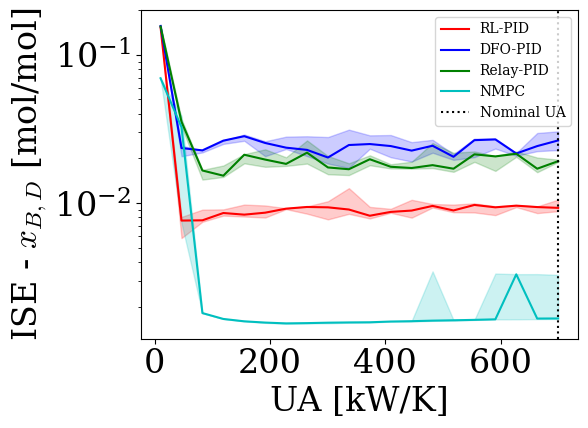

In [283]:
# plt.figure()
# plt.plot(UA,IAE_Ca_UA,label = methods)
# plt.axvline(x = 5e4, color = 'b', label = 'Nominal UA')
# plt.ylabel('ISE - $C_A$')
# plt.xlabel('UA')
# plt.legend()
# plt.show()

# plt.figure()
# plt.plot(UA,IAE_T_UA,label = methods)
# plt.axvline(x = 5e4, color = 'b', label = 'Nominal UA')
# plt.ylabel('ISE - T')
# plt.xlabel('UA')
# plt.legend()
# plt.show()


plt.figure()

for i in range(4):
    plt.plot(UA/1e3,np.median(IAE_xd_UA[:,i,:],axis = 1),color = col[i],label = methods[i])
    plt.gca().fill_between(UA/1e3, np.min(IAE_xd_UA[:,i,:],axis=1), np.max(IAE_xd_UA[:,i,:],axis=1),color = col[i],alpha=0.2)
plt.axvline(x = 7e2, color = 'black',linestyle = 'dotted', label = 'Nominal UA')
plt.ylabel('ISE - $x_{B,D}$ [mol/mol]')
plt.yscale('log')
plt.xlabel('UA [kW/K]')
plt.legend(loc = 'upper right',prop={'size':10})
plt.tight_layout()
plt.savefig('CS2_ParaMis_UA.pdf')
plt.show()



In [288]:
np.save('param_mis_UA_CS2.npy',xd_dat_UA)
np.save('param_mis_k0_CS2.npy',xd_dat_k0)